# OpenEarable — Osteoporosis Detection Pipeline (v10)
## Unified Bone Accelerometer + Inward Microphone Pipeline

**Pipeline — Bone Accelerometer:**
1. Compute bone_mag → Bandpass 100–2500 Hz (full session)
2. Spectrum Variance D(t) → Detection
3. Extract clench [peak − 50 ms : peak + 50 ms] → Loudness Normalise → ZCP

**Pipeline — Inward Microphone:**
1. Bandpass 100–2500 Hz (full session, both channels) → Spectral Subtraction (full session)
2. Spectrum Variance D(t) → Detection
3. Extract clench [peak − 50 ms : peak + 50 ms] → Loudness Normalise → ZCP

**Dataset:** P1, P3 (healthy) | P3_O, P4_O, P5_O (osteoporosis) — P2 excluded
**Window:** skip 3 s, use 27 s

---

## Cell 1 — Libraries

In [1]:
!pip install librosa statsmodels scipy numpy pandas matplotlib -q

import os, warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal
from scipy.stats import gaussian_kde
import wave

print('All libraries loaded successfully.')

All libraries loaded successfully.


## Cell 2 — Session Definitions

In [2]:
from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = '/content/drive/MyDrive/MunsitData'

PARTICIPANT_COLORS = {
    'P1':   '#2E7D32',
    'P3':   '#81C784',
    'P3_O': '#C62828',
    'P4_O': '#B71C1C',
    'P5_O': '#E53935',
}

EXPECTED_CLENCHES = {
    'P1_s1': (13,14), 'P1_s2': (15,15), 'P1_s3': (13,13), 'P1_s4': (13,14),
    'P3_s1': (12,12), 'P3_s2': (12,14), 'P3_s3': (13,13), 'P3_s4': (12,12),
    'P3_O_s1': (9,9),   'P3_O_s2': (11,11), 'P3_O_s3': (11,11),
    'P4_O_s1': (12,12), 'P4_O_s2': (11,11), 'P4_O_s3': (11,11),
    'P5_O_s1': (16,16), 'P5_O_s2': (19,19), 'P5_O_s3': (25,25),
}

def make_path(folder, filename):
    return f'{DRIVE_ROOT}/{folder}/{filename}'

SESSION_DEFS = [
    ('healthy participant1','healthy acc participant1 right ear1.csv','healthy participant1 right ear1.wav','healthy','P1',1),
    ('healthy participant1','healthy acc participant1 right ear2.csv','healthy participant1 right ear2.wav','healthy','P1',2),
    ('healthy participant1','healthy acc participant1 right ear3.csv','healthy participant1 right ear3.wav','healthy','P1',3),
    ('healthy participant1','healthy acc participant1 right ear4.csv','healthy participant1 right ear4.wav','healthy','P1',4),
    ('healthy participant3','healthy acc participant3 right ear1.csv','healthy participant3 right ear1.wav','healthy','P3',1),
    ('healthy participant3','healthy acc participant3 right ear2.csv','healthy participant3 right ear2.wav','healthy','P3',2),
    ('healthy participant3','healthy acc participant3 right ear3.csv','healthy participant3 right ear3.wav','healthy','P3',3),
    ('healthy participant3','healthy acc participant3 right ear4.csv','healthy participant3 right ear4.wav','healthy','P3',4),
    ('Osteoporosis participant3','Osteoporosis acc participant3 right ear1.csv','Osteoporosis participant3 right ear1.wav','osteoporosis','P3_O',1),
    ('Osteoporosis participant3','Osteoporosis acc participant3 right ear2.csv','Osteoporosis participant3 right ear2.wav','osteoporosis','P3_O',2),
    ('Osteoporosis participant3','Osteoporosis acc participant3 right ear3.csv','Osteoporosis participant3 right ear3.wav','osteoporosis','P3_O',3),
    ('Osteoporosis participant4','Osteoporosis acc participant4 right ear1.csv','Osteoporosis participant4 right ear1.wav','osteoporosis','P4_O',1),
    ('Osteoporosis participant4','Osteoporosis acc participant4 right ear2.csv','Osteoporosis participant4 right ear2.wav','osteoporosis','P4_O',2),
    ('Osteoporosis participant4','Osteoporosis acc participant4 right ear3.csv','Osteoporosis participant4 right ear3.wav','osteoporosis','P4_O',3),
    ('Osteoporosis participant5','Osteoporosis acc participant5 right ear1.csv','Osteoporosis participant5 right ear1.wav','osteoporosis','P5_O',1),
    ('Osteoporosis participant5','Osteoporosis acc participant5 right ear2.csv','Osteoporosis participant5 right ear2.wav','osteoporosis','P5_O',2),
    ('Osteoporosis participant5','Osteoporosis acc participant5 right ear3.csv','Osteoporosis participant5 right ear3.wav','osteoporosis','P5_O',3),
]

sessions = []
all_ok = True
for (folder, csv_name, wav_name, label_str, pid, snum) in SESSION_DEFS:
    csv_path   = make_path(folder, csv_name)
    wav_path   = make_path(folder, wav_name)
    label      = 0 if label_str == 'healthy' else 1
    session_id = f'{pid}_s{snum}'
    csv_ok     = 'OK' if os.path.exists(csv_path) else 'MISSING'
    wav_ok     = 'OK' if os.path.exists(wav_path) else 'MISSING'
    if 'MISSING' in (csv_ok, wav_ok): all_ok = False
    exp = EXPECTED_CLENCHES.get(session_id, ('?','?'))
    print(f'  {session_id:12s} | {label_str:10s} | CSV:{csv_ok} | WAV:{wav_ok} | expected:{exp[0]}-{exp[1]}')
    sessions.append({
        'csv': csv_path, 'wav': wav_path,
        'label': label, 'label_str': label_str,
        'session_id': session_id, 'participant': pid,
        'color': PARTICIPANT_COLORS[pid],
        'expected_clenches': exp,
    })

print()
print('All files found.' if all_ok else 'WARNING: some files are missing.')
print(f'Total    : {len(sessions)} sessions')
print(f'Healthy  : {sum(1 for s in sessions if s["label"]==0)}')
print(f'Osteoporosis: {sum(1 for s in sessions if s["label"]==1)}')

Mounted at /content/drive
  P1_s1        | healthy    | CSV:OK | WAV:OK | expected:13-14
  P1_s2        | healthy    | CSV:OK | WAV:OK | expected:15-15
  P1_s3        | healthy    | CSV:OK | WAV:OK | expected:13-13
  P1_s4        | healthy    | CSV:OK | WAV:OK | expected:13-14
  P3_s1        | healthy    | CSV:OK | WAV:OK | expected:12-12
  P3_s2        | healthy    | CSV:OK | WAV:OK | expected:12-14
  P3_s3        | healthy    | CSV:OK | WAV:OK | expected:13-13
  P3_s4        | healthy    | CSV:OK | WAV:OK | expected:12-12
  P3_O_s1      | osteoporosis | CSV:OK | WAV:OK | expected:9-9
  P3_O_s2      | osteoporosis | CSV:OK | WAV:OK | expected:11-11
  P3_O_s3      | osteoporosis | CSV:OK | WAV:OK | expected:11-11
  P4_O_s1      | osteoporosis | CSV:OK | WAV:OK | expected:12-12
  P4_O_s2      | osteoporosis | CSV:OK | WAV:OK | expected:11-11
  P4_O_s3      | osteoporosis | CSV:OK | WAV:OK | expected:11-11
  P5_O_s1      | osteoporosis | CSV:OK | WAV:OK | expected:16-16
  P5_O_s2      | 

## Cell 3 — Load Data (skip 3 s, use 27 s)

In [3]:
SKIP_SEC = 3.0
USE_SEC  = 27.0

def load_csv_session(csv_path, skip_sec=3.0, use_sec=27.0):
    """Load bone accelerometer CSV and trim to the analysis window."""
    df = pd.read_csv(csv_path)
    df.rename(columns={'Unnamed: 0': 'timestamp'}, inplace=True)
    t0 = df['timestamp'].iloc[0]
    df = df[(df['timestamp'] >= t0 + skip_sec) &
            (df['timestamp'] <  t0 + skip_sec + use_sec)].copy()
    df.reset_index(drop=True, inplace=True)
    return df, df['timestamp'].iloc[-1] - df['timestamp'].iloc[0]

def load_wav_session(wav_path, skip_sec=3.0, use_sec=27.0):
    """
    Load stereo WAV and trim to the analysis window.
    Channel 0 = inward-facing microphone (bone-conducted signal).
    Channel 1 = outward-facing microphone (ambient noise reference).
    """
    with wave.open(wav_path, 'rb') as w:
        n_ch   = w.getnchannels()
        fs     = w.getframerate()
        frames = w.readframes(w.getnframes())
    data    = np.frombuffer(frames, dtype=np.int16).astype(np.float64)
    inward  = data[0::2] if n_ch == 2 else data
    outward = data[1::2] if n_ch == 2 else np.zeros_like(data)
    i_s = int(skip_sec * fs)
    i_e = int((skip_sec + use_sec) * fs)
    return inward[i_s:i_e], outward[i_s:i_e], fs

loaded_sessions = []
for s in sessions:
    df, dur   = load_csv_session(s['csv'], SKIP_SEC, USE_SEC)
    bone_df   = df.dropna(subset=['bone_acc.x'])[
                    ['timestamp','bone_acc.x','bone_acc.y','bone_acc.z']].copy()
    bone_df.set_index('timestamp', inplace=True)
    fs_bone   = 1.0 / np.median(np.diff(bone_df.index.values))

    inward, outward, fs_mic = load_wav_session(s['wav'], SKIP_SEC, USE_SEC)

    print(f'  {s["session_id"]:12s} | bone: {len(bone_df)} pts @ {fs_bone:.0f} Hz'
          f' | mic: {len(inward)} pts @ {fs_mic} Hz | dur: {dur:.2f} s')

    loaded_sessions.append({
        **s,
        'bone_df': bone_df, 'fs_bone': fs_bone,
        'inward':  inward,  'outward': outward, 'fs_mic': fs_mic,
    })

print('\nAll sessions loaded.')

  P1_s1        | bone: 173847 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P1_s2        | bone: 173871 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P1_s3        | bone: 173924 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P1_s4        | bone: 173867 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_s1        | bone: 173929 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_s2        | bone: 173953 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_s3        | bone: 173954 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_s4        | bone: 173922 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_O_s1      | bone: 173438 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_O_s2      | bone: 173539 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P3_O_s3      | bone: 173507 pts @ 6413 Hz | mic: 1296000 pts @ 48000 Hz | dur: 27.00 s
  P4_O_s1      | bone

## Cell 4 — Shared Signal Processing Functions

In [4]:
# ── Constants ────────────────────────────────────────────────────────────────
BP_LOW  = 100     # Hz — bandpass lower cutoff (both modalities)
BP_HIGH = 2500    # Hz — bandpass upper cutoff
BP_ORDER = 4      # Butterworth filter order

ALPHA_SS = 1.0    # spectral subtraction over-subtraction factor
BETA_SS  = 0.002  # spectral subtraction floor parameter

Q_SUBBANDS   = 8
SUB_WIN_SEC  = 0.0025   # 2.5 ms sub-window for spectrum variance
SUB_WIN_STEP = 0.001    # 1 ms sub-window step
DET_FRAME    = 0.050    # 50 ms detection frame
DET_STEP     = 0.010    # 10 ms detection step

MIN_DUR_SEC    = 0.050   # half clench window (peak ± 50 ms)
REFRACTORY_SEC = 0.500   # minimum time between detected peaks


# ── Bandpass filter ───────────────────────────────────────────────────────────
def bandpass(signal, low=BP_LOW, high=BP_HIGH, fs=None, order=BP_ORDER):
    """Zero-phase Butterworth bandpass filter."""
    nyq  = fs / 2.0
    high = min(high, nyq * 0.99)
    b, a = scipy.signal.butter(order, [low / nyq, high / nyq], btype='band')
    return scipy.signal.filtfilt(b, a, signal)


# ── Spectral subtraction (full session) ──────────────────────────────────────
def spectral_subtraction(inward, outward, alpha=ALPHA_SS, beta=BETA_SS):
    """
    Power spectral subtraction applied to the full session signal.
    Uses the outward-facing microphone as the ambient noise reference (TeethPass+ eq. 1).
    |X_hat(k)|^2 = max(|X(k)|^2 - alpha*|D(k)|^2, beta*|D(k)|^2)
    """
    m         = min(len(inward), len(outward))
    X         = np.fft.rfft(inward[:m])
    D         = np.fft.rfft(outward[:m])
    clean_pow = np.maximum(np.abs(X)**2 - alpha * np.abs(D)**2,
                           beta * np.abs(D)**2)
    X_clean   = np.sqrt(clean_pow) * np.exp(1j * np.angle(X))
    clean     = np.fft.irfft(X_clean, n=m)
    if len(inward) > m:
        clean = np.concatenate([clean, inward[m:]])
    return clean[:len(inward)]


# ── Spectrum variance (single frame) ─────────────────────────────────────────
def compute_spectrum_variance(frame, fs):
    """
    Compute inter-band spectrum variance D for one detection frame.
    The frame is split into overlapping sub-windows; each sub-window FFT
    magnitude is averaged into Q_SUBBANDS bands. D is the variance across
    those band averages — high during clenches, low during silence.
    """
    sub_win  = int(SUB_WIN_SEC  * fs)
    sub_step = int(SUB_WIN_STEP * fs)
    if len(frame) < sub_win or sub_win < 1:
        return 0.0
    SE = []
    for j in range(0, len(frame) - sub_win, sub_step):
        X   = np.abs(np.fft.rfft(frame[j:j + sub_win].astype(float)))
        pts = max(1, len(X) // Q_SUBBANDS)
        SE.append([np.mean(X[n * pts:(n + 1) * pts]) for n in range(Q_SUBBANDS)])
    if not SE:
        return 0.0
    SE         = np.array(SE)
    mean_bands = SE.mean(axis=0)
    grand_mean = mean_bands.mean()
    return float(np.sum((mean_bands - grand_mean) ** 2) / (Q_SUBBANDS - 1))


# ── D(t) curve over a full session signal ────────────────────────────────────
def compute_D_curve(signal, fs, time_rel=None):
    """
    Compute normalised spectrum variance D(t) over a full session signal.
    If time_rel is provided, D timestamps are taken from the actual device
    timestamps to avoid drift from nominal sampling rate assumptions.
    """
    win  = int(DET_FRAME * fs)
    step = int(DET_STEP  * fs)
    D_vals, D_times = [], []
    for k in range(0, len(signal) - win, step):
        D_vals.append(compute_spectrum_variance(signal[k:k + win], fs))
        if time_rel is not None:
            D_times.append(time_rel[k + win // 2])   # centre of window using device timestamps
        else:
            D_times.append((k + win // 2) / fs)       # fallback: nominal timestamp for mic
    D_arr  = np.array(D_vals)
    D_norm = D_arr / (D_arr.mean() + 1e-12)
    return D_arr, D_norm, np.array(D_times)


# ── Clench detection on D(t) ─────────────────────────────────────────────────
def detect_clenches(D_norm, D_times, threshold):
    """
    Detect clench events from the normalised spectrum variance curve D(t).
    At each threshold crossing the peak D within the refractory window is
    found and used as the clench centre. The refractory period is measured
    from the detected peak, preventing double-detection.
    Returns a list of (t_start, t_end, peak_time) tuples.
    """
    above          = D_norm > threshold
    clenches       = []
    last_peak_time = -REFRACTORY_SEC
    i = 0
    while i < len(D_norm):
        if above[i] and (D_times[i] - last_peak_time) >= REFRACTORY_SEC:
            best_idx, best_D = i, D_norm[i]
            j = i + 1
            while j < len(D_norm) and D_times[j] <= D_times[i] + REFRACTORY_SEC:
                if D_norm[j] > best_D:
                    best_D, best_idx = D_norm[j], j
                j += 1
            peak_time      = D_times[best_idx]
            last_peak_time = peak_time
            t_start = peak_time - MIN_DUR_SEC / 2
            t_end   = peak_time + MIN_DUR_SEC / 2
            if t_start >= 0:
                clenches.append((t_start, t_end, peak_time))
            i = j
        else:
            i += 1
    return clenches


# ── Loudness normalisation ────────────────────────────────────────────────────
def loudness_normalize(sig, target_db=-24.0):
    """RMS-based loudness normalisation to a fixed level in dBFS."""
    rms = np.sqrt(np.mean(sig ** 2))
    if rms < 1e-10:
        return sig
    return sig * (10 ** (target_db / 20.0) / rms)


# ── Zero-crossing point distances ────────────────────────────────────────────
def compute_zcp(segment):
    """
    Compute Zero-Crossing Point (ZCP) distance statistics.
    Distances are sample counts between consecutive zero-crossings.
    Shorter distances indicate higher dominant frequency (stiffer bone).
    Returns (mean, std, median).
    """
    crossings = np.where(np.diff(np.sign(segment)) != 0)[0]
    if len(crossings) < 2:
        return np.nan, np.nan, np.nan
    distances = np.diff(crossings).astype(float)
    return float(np.mean(distances)), float(np.std(distances)), float(np.median(distances))


print('Shared functions ready.')
print(f'  Bandpass          : {BP_LOW}–{BP_HIGH} Hz, order {BP_ORDER}')
print(f'  Spectral sub      : alpha={ALPHA_SS}, beta={BETA_SS}  (MIC only, full session)')
print(f'  Detection frame   : {DET_FRAME*1000:.0f} ms, step {DET_STEP*1000:.0f} ms')
print(f'  Clench window     : peak ± {MIN_DUR_SEC/2*1000:.0f} ms  ({MIN_DUR_SEC/2*2000:.0f} ms total)')
print(f'  Refractory        : {REFRACTORY_SEC*1000:.0f} ms (from peak)')
print(f'  Loudness target   : -24 dBFS (per clench)')

Shared functions ready.
  Bandpass          : 100–2500 Hz, order 4
  Spectral sub      : alpha=1.0, beta=0.002  (MIC only, full session)
  Detection frame   : 50 ms, step 10 ms
  Clench window     : peak ± 25 ms  (50 ms total)
  Refractory        : 500 ms (from peak)
  Loudness target   : -24 dBFS (per clench)


## Cell 5 — Bone Accelerometer Pipeline
`bone_mag → bandpass (full session) → D(t) → detection → extract [peak±50ms] → loudness normalise → ZCP`

In [5]:
BONE_THRESHOLD = {
    'P1':   1.5,
    'P3':   2.5,
    'P3_O': 3.3,
    'P4_O': 1.8,
    'P5_O': 1.2,
}

print('Running bone accelerometer pipeline...')
print()

for s in loaded_sessions:
    fs      = s['fs_bone']
    bone_df = s['bone_df']

    # 1. Bone magnitude
    bone_mag = np.sqrt(bone_df['bone_acc.x'].values**2 +
                       bone_df['bone_acc.y'].values**2 +
                       bone_df['bone_acc.z'].values**2)
    bone_time     = bone_df.index.values
    bone_time_rel = bone_time - bone_time[0]

    # 2. Bandpass — full session
    bone_filt = bandpass(bone_mag, fs=fs)

    # 3. Spectrum variance D(t)
    D_arr, D_norm, D_times = compute_D_curve(bone_filt, fs, time_rel=bone_time_rel)

    # 4. Detection
    thresh   = BONE_THRESHOLD[s['participant']]
    clenches = detect_clenches(D_norm, D_times, thresh)

    # 5. Clench extraction → loudness normalise → ZCP
    samples = []
    for (t_start, t_end, peak_time) in clenches:
        abs_s = bone_time[0] + t_start
        abs_e = bone_time[0] + t_end
        mask  = (bone_time >= abs_s) & (bone_time <= abs_e)
        frame = bone_filt[mask].astype(float)
        if len(frame) < 10:
            continue
        frame = loudness_normalize(frame)
        zm, zs, zmed = compute_zcp(frame)
        samples.append({
            'frame':      frame,
            'peak_time':  peak_time,
            'zcp_mean':   zm,
            'zcp_std':    zs,
            'zcp_median': zmed,
            'duration':   t_end - t_start,
        })

    s['bone_mag']      = bone_mag
    s['bone_filt']     = bone_filt
    s['bone_time']     = bone_time
    s['bone_time_rel'] = bone_time_rel
    s['D_arr_bone']    = D_arr
    s['D_norm_bone']   = D_norm
    s['D_times_bone']  = D_times
    s['clenches_bone'] = clenches
    s['samples_bone']  = samples

    exp    = s['expected_clenches']
    status = 'OK' if exp[0] <= len(samples) <= exp[1] else 'CHECK'
    print(f'  {s["session_id"]:12s} | detected: {len(clenches):3d} | '
          f'extracted: {len(samples):3d} | expected: {exp[0]}-{exp[1]} | {status}')

print()
print('Bone pipeline complete.')

Running bone accelerometer pipeline...

  P1_s1        | detected:  13 | extracted:  13 | expected: 13-14 | OK
  P1_s2        | detected:  15 | extracted:  15 | expected: 15-15 | OK
  P1_s3        | detected:  13 | extracted:  13 | expected: 13-13 | OK
  P1_s4        | detected:  13 | extracted:  13 | expected: 13-14 | OK
  P3_s1        | detected:  12 | extracted:  12 | expected: 12-12 | OK
  P3_s2        | detected:  12 | extracted:  12 | expected: 12-14 | OK
  P3_s3        | detected:  13 | extracted:  13 | expected: 13-13 | OK
  P3_s4        | detected:  12 | extracted:  12 | expected: 12-12 | OK
  P3_O_s1      | detected:   0 | extracted:   0 | expected: 9-9 | CHECK
  P3_O_s2      | detected:  11 | extracted:  11 | expected: 11-11 | OK
  P3_O_s3      | detected:  11 | extracted:  11 | expected: 11-11 | OK
  P4_O_s1      | detected:  10 | extracted:  10 | expected: 12-12 | CHECK
  P4_O_s2      | detected:   4 | extracted:   4 | expected: 11-11 | CHECK
  P4_O_s3      | detected:   6

## Cell 6 — Bone Pipeline Visualisation

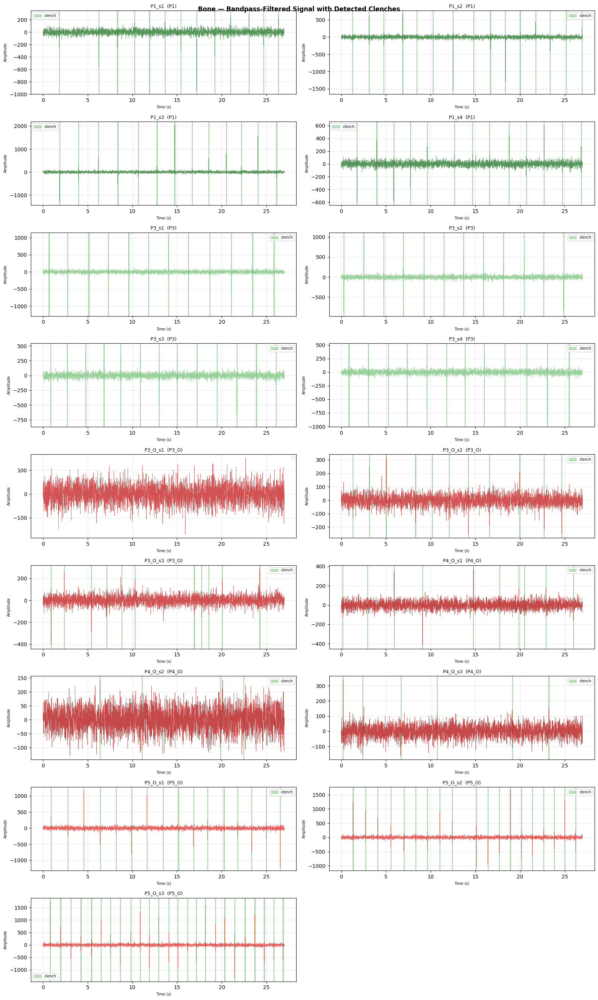

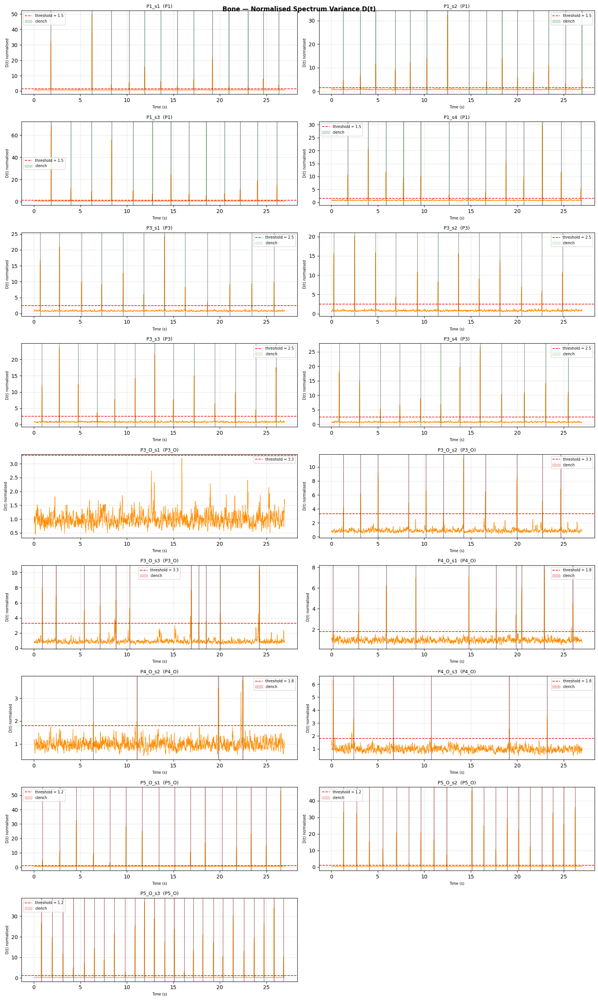

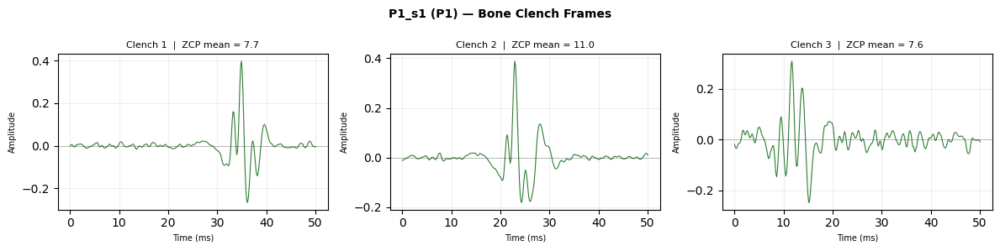

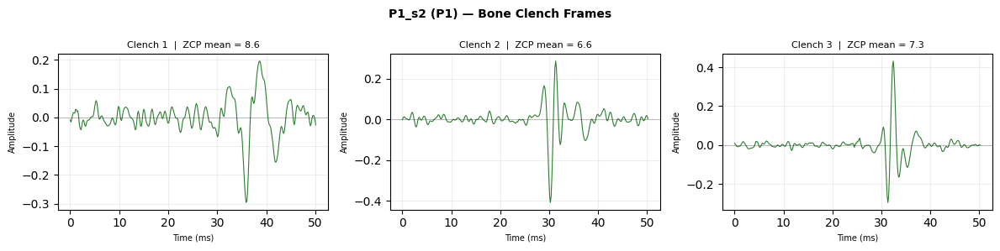

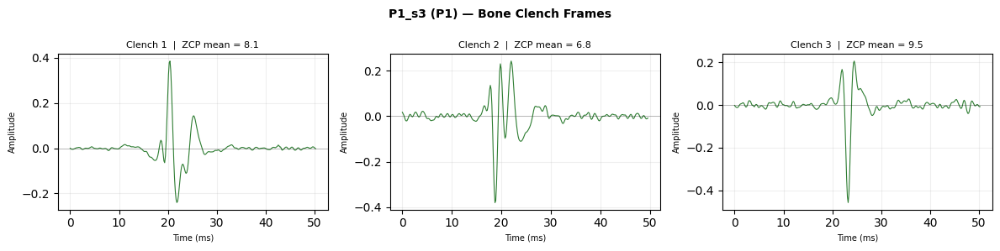

Bone visualisation complete.


In [6]:
n     = len(loaded_sessions)
ncols = 2
nrows = (n + 1) // ncols

# ── Fig 1: filtered signal + detected clenches ───────────────────────────────
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 3 * nrows))
axes = axes.flatten()
fig.suptitle('Bone — Bandpass-Filtered Signal with Detected Clenches',
             fontsize=12, fontweight='bold')
for i, s in enumerate(loaded_sessions):
    ax   = axes[i]
    t    = s['bone_time_rel']
    step = max(1, len(t) // 4000)
    ax.plot(t[::step], s['bone_filt'][::step], color=s['color'], lw=0.5, alpha=0.8)
    for j, (cs, ce, _) in enumerate(s['clenches_bone']):
        ax.axvspan(cs, ce, alpha=0.25, color='green', label='clench' if j == 0 else '')
    ax.set_title(f'{s["session_id"]}  ({s["participant"]})', fontsize=9)
    ax.set_xlabel('Time (s)', fontsize=7); ax.set_ylabel('Amplitude', fontsize=7)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.3)
for ax in axes[n:]: ax.axis('off')
plt.tight_layout(); plt.show()

# ── Fig 2: D(t) with threshold and clench markers ────────────────────────────
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 3 * nrows))
axes = axes.flatten()
fig.suptitle('Bone — Normalised Spectrum Variance D(t)',
             fontsize=12, fontweight='bold')
for i, s in enumerate(loaded_sessions):
    ax  = axes[i]
    c   = s['color']
    thr = BONE_THRESHOLD[s['participant']]
    ax.plot(s['D_times_bone'], s['D_norm_bone'], color='darkorange', lw=0.8)
    ax.axhline(thr, color='red', lw=1.2, linestyle='--', label=f'threshold = {thr}')
    for j, (cs, ce, pk) in enumerate(s['clenches_bone']):
        ax.axvspan(cs, ce, alpha=0.2, color=c, label='clench' if j == 0 else '')
        ax.axvline(pk, color='black', lw=0.6, alpha=0.5)
    ax.set_title(f'{s["session_id"]}  ({s["participant"]})', fontsize=9)
    ax.set_xlabel('Time (s)', fontsize=7); ax.set_ylabel('D(t) normalised', fontsize=7)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.3)
for ax in axes[n:]: ax.axis('off')
plt.tight_layout(); plt.show()

# ── Fig 3: first 3 clench frames for first 3 sessions ────────────────────────
for s in loaded_sessions[:3]:
    samps = s['samples_bone'][:3]
    if not samps: continue
    fig, axes = plt.subplots(1, len(samps), figsize=(len(samps) * 4, 3))
    if len(samps) == 1: axes = [axes]
    fig.suptitle(f'{s["session_id"]} ({s["participant"]}) — Bone Clench Frames',
                 fontsize=10, fontweight='bold')
    for j, samp in enumerate(samps):
        ax = axes[j]
        t  = np.arange(len(samp['frame'])) / s['fs_bone'] * 1000
        ax.plot(t, samp['frame'], color=s['color'], lw=0.8)
        ax.axhline(0, color='black', lw=0.4, alpha=0.4)
        ax.set_title(f'Clench {j+1}  |  ZCP mean = {samp["zcp_mean"]:.1f}', fontsize=8)
        ax.set_xlabel('Time (ms)', fontsize=7); ax.set_ylabel('Amplitude', fontsize=7)
        ax.grid(True, alpha=0.2)
    plt.tight_layout(); plt.show()

print('Bone visualisation complete.')

## Cell 7 — Bone Feature DataFrame

In [7]:
feat_rows_bone = []
for s in loaded_sessions:
    for samp in s['samples_bone']:
        feat_rows_bone.append({
            'session_id':  s['session_id'],
            'label':       s['label'],
            'label_str':   s['label_str'],
            'participant': s['participant'],
            'color':       s['color'],
            'zcp_mean':    samp['zcp_mean'],
            'zcp_std':     samp['zcp_std'],
            'zcp_median':  samp['zcp_median'],
            'duration_ms': samp['duration'] * 1000,
        })
df_bone = pd.DataFrame(feat_rows_bone)

print(f'Bone feature dataframe: {len(df_bone)} clench frames')
print()
print(df_bone.groupby(['participant','label_str']).size().rename('n_clenches').to_string())
print()
print('ZCP statistics by group:')
print(df_bone.groupby('label_str')[['zcp_mean','zcp_std','zcp_median']].agg(['mean','std']).round(2))

Bone feature dataframe: 205 clench frames

participant  label_str   
P1           healthy         54
P3           healthy         49
P3_O         osteoporosis    22
P4_O         osteoporosis    20
P5_O         osteoporosis    60

ZCP statistics by group:
             zcp_mean       zcp_std       zcp_median      
                 mean   std    mean   std       mean   std
label_str                                                 
healthy          8.00  0.98    5.69  1.11       6.32  0.95
osteoporosis     9.71  1.80    7.86  1.86       6.71  1.51


## Cell 8 — Bone ZCP Feature Visualisation

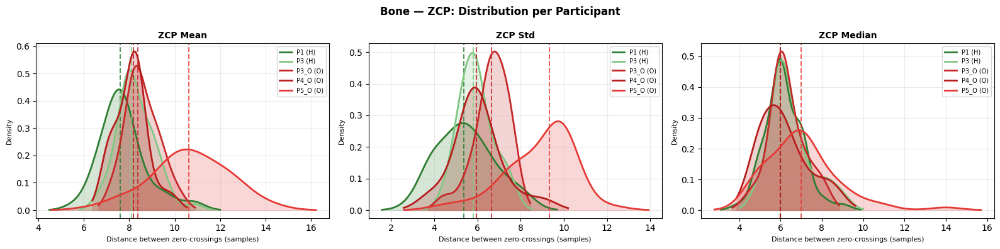

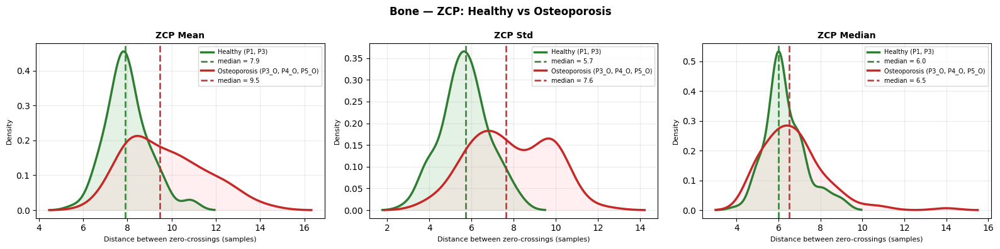

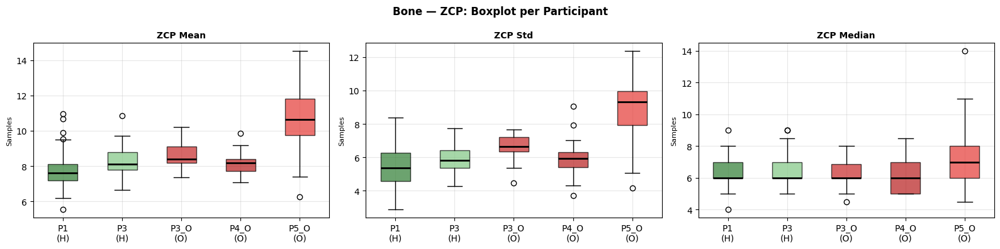

Bone ZCP — Healthy vs Osteoporosis (median):
  Feature      |   H median |   O median |    Delta %
  ------------------------------------------------
  ZCP Mean     |       7.90 |       9.46 |      -16.4%
  ZCP Std      |       5.71 |       7.63 |      -25.1%
  ZCP Median   |       6.00 |       6.50 |       -7.7%


In [8]:
ZCP_FEATURES = {'ZCP Mean': 'zcp_mean', 'ZCP Std': 'zcp_std', 'ZCP Median': 'zcp_median'}

# ── KDE per participant ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Bone — ZCP: Distribution per Participant', fontsize=12, fontweight='bold')
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax = axes[idx]
    for pid in sorted(df_bone['participant'].unique()):
        c    = PARTICIPANT_COLORS[pid]
        lv   = df_bone[df_bone['participant']==pid]['label'].iloc[0]
        vals = df_bone[df_bone['participant']==pid][col].dropna().values
        if len(vals) < 3: continue
        try:
            kde = gaussian_kde(vals, bw_method='scott')
            xs  = np.linspace(vals.min()-vals.std(), vals.max()+vals.std(), 300)
            ax.fill_between(xs, kde(xs), alpha=0.2, color=c)
            ax.plot(xs, kde(xs), color=c, lw=2,
                    label=f'{pid} ({"H" if lv==0 else "O"})')
            ax.axvline(np.median(vals), color=c, lw=1.5, linestyle='--', alpha=0.8)
        except:
            ax.hist(vals, bins=8, color=c, alpha=0.4,
                    label=f'{pid} ({"H" if lv==0 else "O"})')
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_xlabel('Distance between zero-crossings (samples)', fontsize=8)
    ax.set_ylabel('Density', fontsize=8)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.show()

# ── KDE Healthy vs Osteoporosis ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Bone — ZCP: Healthy vs Osteoporosis', fontsize=12, fontweight='bold')
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax = axes[idx]
    for lv, c, cl, lbl in [
        (0, '#2E7D32', '#A5D6A7', 'Healthy (P1, P3)'),
        (1, '#C62828', '#FFCDD2', 'Osteoporosis (P3_O, P4_O, P5_O)'),
    ]:
        vals = df_bone[df_bone['label']==lv][col].dropna().values
        if len(vals) < 3: continue
        kde = gaussian_kde(vals, bw_method='scott')
        xs  = np.linspace(vals.min()-vals.std(), vals.max()+vals.std(), 300)
        ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
        ax.plot(xs, kde(xs), color=c, lw=2.5, label=lbl)
        ax.axvline(np.median(vals), color=c, lw=2, linestyle='--', alpha=0.9,
                   label=f'median = {np.median(vals):.1f}')
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_xlabel('Distance between zero-crossings (samples)', fontsize=8)
    ax.set_ylabel('Density', fontsize=8)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.show()

# ── Boxplot per participant ───────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Bone — ZCP: Boxplot per Participant', fontsize=12, fontweight='bold')
pids = sorted(df_bone['participant'].unique())
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax   = axes[idx]
    data = [df_bone[df_bone['participant']==p][col].dropna().values for p in pids]
    lbls = [f'{p}\n({"H" if df_bone[df_bone.participant==p]["label"].iloc[0]==0 else "O"})' for p in pids]
    bp   = ax.boxplot(data, labels=lbls, patch_artist=True)
    for patch, pid in zip(bp['boxes'], pids):
        patch.set_facecolor(PARTICIPANT_COLORS[pid]); patch.set_alpha(0.7)
    for med in bp['medians']:
        med.set_color('black'); med.set_linewidth(2)
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=8); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print('Bone ZCP — Healthy vs Osteoporosis (median):')
print(f'  {"Feature":12s} | {"H median":>10s} | {"O median":>10s} | {"Delta %":>10s}')
print(f'  {"-"*48}')
for name, col in ZCP_FEATURES.items():
    h = df_bone[df_bone['label']==0][col].median()
    o = df_bone[df_bone['label']==1][col].median()
    print(f'  {name:12s} | {h:10.2f} | {o:10.2f} | {(h-o)/(abs(o)+1e-10)*100:+10.1f}%')

## Cell 9 — Inward Microphone Pipeline
`bandpass (full session) → spectral subtraction (full session) → D(t) → detection → extract [peak±50ms] → loudness normalise → ZCP`

In [9]:
MIC_THRESHOLD = {
    'P1':   1.9,
    'P3':   3.8,
    'P3_O': 3.7,
    'P4_O': 3.0,
    'P5_O': 1.2,
}

print('Running inward microphone pipeline...')
print()

for s in loaded_sessions:
    fs_mic  = s['fs_mic']
    inward  = s['inward'].astype(float)
    outward = s['outward'].astype(float)

    # 1. Bandpass — full session (both channels)
    inward_bp  = bandpass(inward,  fs=fs_mic)
    outward_bp = bandpass(outward, fs=fs_mic)

    # 2. Spectral subtraction — full session
    inward_clean = spectral_subtraction(inward_bp, outward_bp)

    # 3. Spectrum variance D(t)
    D_arr, D_norm, D_times = compute_D_curve(inward_clean, fs_mic)

    # 4. Detection
    thresh   = MIC_THRESHOLD[s['participant']]
    clenches = detect_clenches(D_norm, D_times, thresh)

    # 5. Clench extraction → loudness normalise → ZCP
    samples = []
    for (t_start, t_end, peak_time) in clenches:
        i_s   = max(0, int(t_start * fs_mic))
        i_e   = min(len(inward_clean), int(t_end * fs_mic))
        frame = inward_clean[i_s:i_e].astype(float)
        if len(frame) < 10:
            continue
        frame = loudness_normalize(frame)
        zm, zs, zmed = compute_zcp(frame)
        samples.append({
            'frame':      frame,
            'peak_time':  peak_time,
            'zcp_mean':   zm,
            'zcp_std':    zs,
            'zcp_median': zmed,
            'duration':   t_end - t_start,
        })

    s['inward_clean']  = inward_clean
    s['D_arr_mic']     = D_arr
    s['D_norm_mic']    = D_norm
    s['D_times_mic']   = D_times
    s['clenches_mic']  = clenches
    s['samples_mic']   = samples

    exp    = s['expected_clenches']
    status = 'OK' if exp[0] <= len(samples) <= exp[1] else 'CHECK'
    print(f'  {s["session_id"]:12s} | detected: {len(clenches):3d} | '
          f'extracted: {len(samples):3d} | expected: {exp[0]}-{exp[1]} | {status}')

print()
print('Microphone pipeline complete.')

Running inward microphone pipeline...

  P1_s1        | detected:  13 | extracted:  13 | expected: 13-14 | OK
  P1_s2        | detected:  15 | extracted:  15 | expected: 15-15 | OK
  P1_s3        | detected:  13 | extracted:  13 | expected: 13-13 | OK
  P1_s4        | detected:  14 | extracted:  14 | expected: 13-14 | OK
  P3_s1        | detected:  12 | extracted:  12 | expected: 12-12 | OK
  P3_s2        | detected:  14 | extracted:  14 | expected: 12-14 | OK
  P3_s3        | detected:  13 | extracted:  13 | expected: 13-13 | OK
  P3_s4        | detected:  12 | extracted:  12 | expected: 12-12 | OK
  P3_O_s1      | detected:   2 | extracted:   2 | expected: 9-9 | CHECK
  P3_O_s2      | detected:  11 | extracted:  11 | expected: 11-11 | OK
  P3_O_s3      | detected:   9 | extracted:   9 | expected: 11-11 | CHECK
  P4_O_s1      | detected:  12 | extracted:  12 | expected: 12-12 | OK
  P4_O_s2      | detected:   3 | extracted:   3 | expected: 11-11 | CHECK
  P4_O_s3      | detected:   3 

## Cell 10 — Microphone Pipeline Visualisation

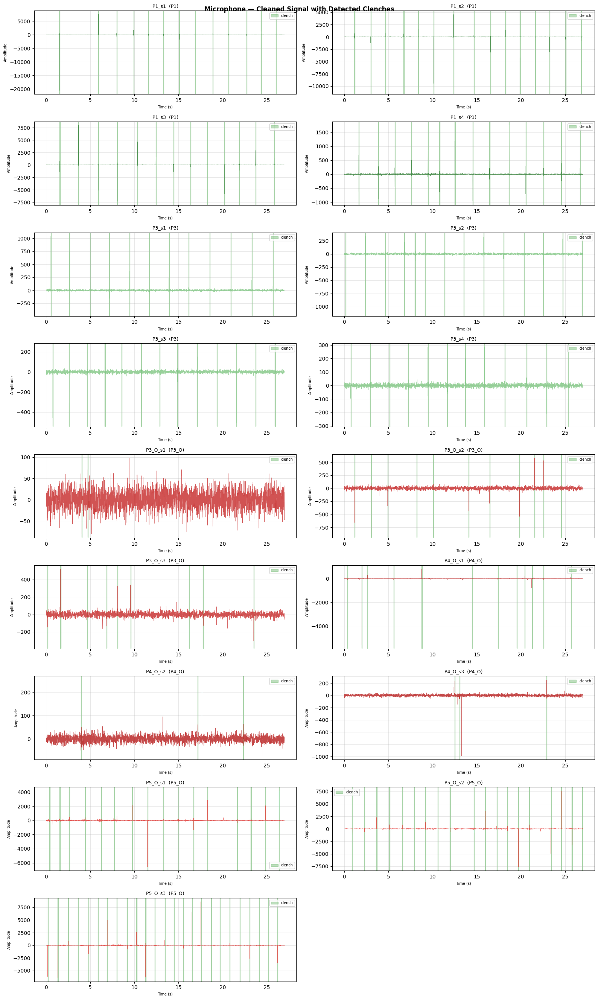

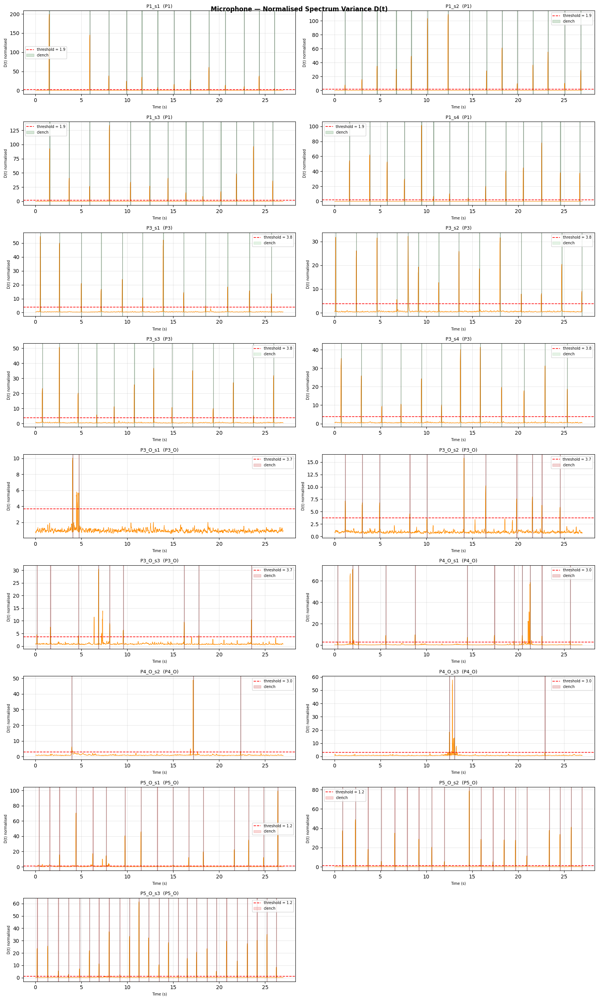

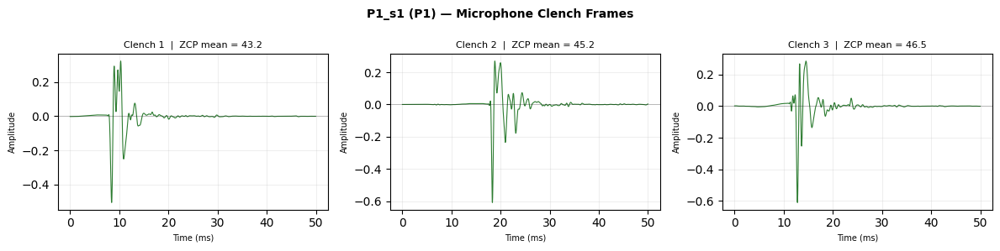

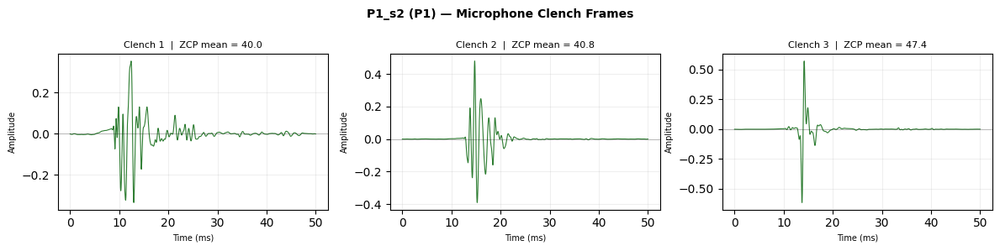

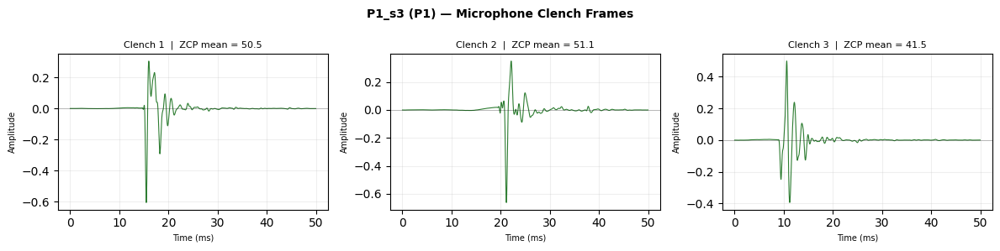

Microphone visualisation complete.


In [10]:
n     = len(loaded_sessions)
ncols = 2
nrows = (n + 1) // ncols

# ── Fig 1: cleaned signal + detected clenches ─────────────────────────────────
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 3 * nrows))
axes = axes.flatten()
fig.suptitle('Microphone — Cleaned Signal with Detected Clenches',
             fontsize=12, fontweight='bold')
for i, s in enumerate(loaded_sessions):
    ax   = axes[i]
    fs   = s['fs_mic']
    sig  = s['inward_clean']
    t    = np.arange(len(sig)) / fs
    step = max(1, len(t) // 4000)
    ax.plot(t[::step], sig[::step], color=s['color'], lw=0.5, alpha=0.8)
    for j, (cs, ce, _) in enumerate(s['clenches_mic']):
        ax.axvspan(cs, ce, alpha=0.25, color='green', label='clench' if j == 0 else '')
    ax.set_title(f'{s["session_id"]}  ({s["participant"]})', fontsize=9)
    ax.set_xlabel('Time (s)', fontsize=7); ax.set_ylabel('Amplitude', fontsize=7)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.3)
for ax in axes[n:]: ax.axis('off')
plt.tight_layout(); plt.show()

# ── Fig 2: D(t) with threshold and clench markers ────────────────────────────
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 3 * nrows))
axes = axes.flatten()
fig.suptitle('Microphone — Normalised Spectrum Variance D(t)',
             fontsize=12, fontweight='bold')
for i, s in enumerate(loaded_sessions):
    ax  = axes[i]
    c   = s['color']
    thr = MIC_THRESHOLD[s['participant']]
    ax.plot(s['D_times_mic'], s['D_norm_mic'], color='darkorange', lw=0.8)
    ax.axhline(thr, color='red', lw=1.2, linestyle='--', label=f'threshold = {thr}')
    for j, (cs, ce, pk) in enumerate(s['clenches_mic']):
        ax.axvspan(cs, ce, alpha=0.2, color=c, label='clench' if j == 0 else '')
        ax.axvline(pk, color='black', lw=0.6, alpha=0.5)
    ax.set_title(f'{s["session_id"]}  ({s["participant"]})', fontsize=9)
    ax.set_xlabel('Time (s)', fontsize=7); ax.set_ylabel('D(t) normalised', fontsize=7)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.3)
for ax in axes[n:]: ax.axis('off')
plt.tight_layout(); plt.show()

# ── Fig 3: first 3 clench frames for first 3 sessions ────────────────────────
for s in loaded_sessions[:3]:
    samps = s['samples_mic'][:3]
    if not samps: continue
    fig, axes = plt.subplots(1, len(samps), figsize=(len(samps) * 4, 3))
    if len(samps) == 1: axes = [axes]
    fig.suptitle(f'{s["session_id"]} ({s["participant"]}) — Microphone Clench Frames',
                 fontsize=10, fontweight='bold')
    for j, samp in enumerate(samps):
        ax = axes[j]
        t  = np.arange(len(samp['frame'])) / s['fs_mic'] * 1000
        ax.plot(t, samp['frame'], color=s['color'], lw=0.8)
        ax.axhline(0, color='black', lw=0.4, alpha=0.4)
        ax.set_title(f'Clench {j+1}  |  ZCP mean = {samp["zcp_mean"]:.1f}', fontsize=8)
        ax.set_xlabel('Time (ms)', fontsize=7); ax.set_ylabel('Amplitude', fontsize=7)
        ax.grid(True, alpha=0.2)
    plt.tight_layout(); plt.show()

print('Microphone visualisation complete.')

## Cell 11 — Microphone Feature DataFrame

In [11]:
feat_rows_mic = []
for s in loaded_sessions:
    for samp in s['samples_mic']:
        feat_rows_mic.append({
            'session_id':  s['session_id'],
            'label':       s['label'],
            'label_str':   s['label_str'],
            'participant': s['participant'],
            'color':       s['color'],
            'zcp_mean':    samp['zcp_mean'],
            'zcp_std':     samp['zcp_std'],
            'zcp_median':  samp['zcp_median'],
            'duration_ms': samp['duration'] * 1000,
        })
df_mic = pd.DataFrame(feat_rows_mic)

print(f'Microphone feature dataframe: {len(df_mic)} clench frames')
print()
print(df_mic.groupby(['participant','label_str']).size().rename('n_clenches').to_string())
print()
print('ZCP statistics by group:')
print(df_mic.groupby('label_str')[['zcp_mean','zcp_std','zcp_median']].agg(['mean','std']).round(2))

Microphone feature dataframe: 206 clench frames

participant  label_str   
P1           healthy         55
P3           healthy         51
P3_O         osteoporosis    22
P4_O         osteoporosis    18
P5_O         osteoporosis    60

ZCP statistics by group:
             zcp_mean       zcp_std        zcp_median      
                 mean   std    mean    std       mean   std
label_str                                                  
healthy         41.19  9.29   43.99  11.54      24.68  7.30
osteoporosis    36.13  9.78   35.69  10.55      24.04  9.47


## Cell 12 — Microphone ZCP Feature Visualisation

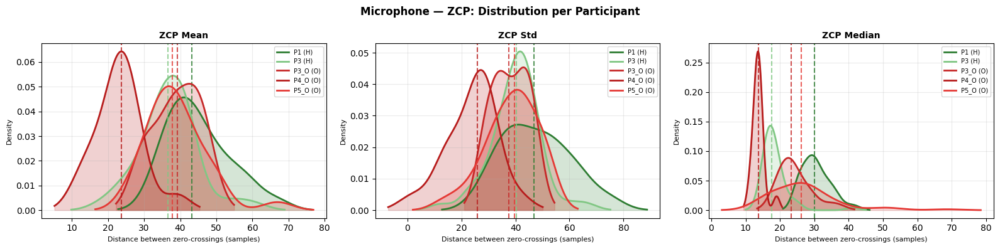

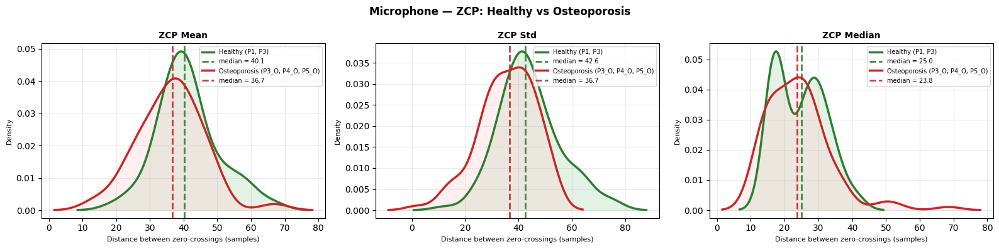

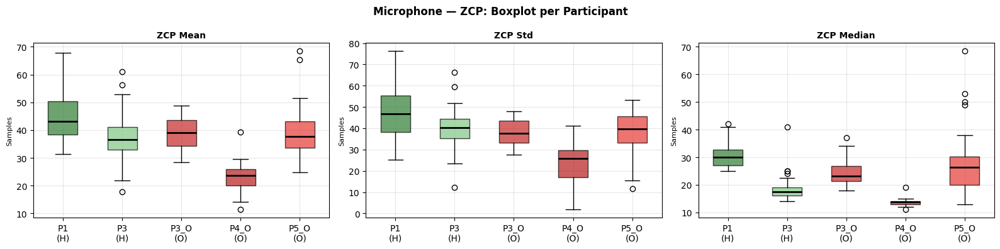

Microphone ZCP — Healthy vs Osteoporosis (median):
  Feature      |   H median |   O median |    Delta %
  ------------------------------------------------
  ZCP Mean     |      40.13 |      36.69 |       +9.4%
  ZCP Std      |      42.63 |      36.67 |      +16.2%
  ZCP Median   |      25.00 |      23.75 |       +5.3%


In [12]:
# ── KDE per participant ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Microphone — ZCP: Distribution per Participant', fontsize=12, fontweight='bold')
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax = axes[idx]
    for pid in sorted(df_mic['participant'].unique()):
        c    = PARTICIPANT_COLORS[pid]
        lv   = df_mic[df_mic['participant']==pid]['label'].iloc[0]
        vals = df_mic[df_mic['participant']==pid][col].dropna().values
        if len(vals) < 3: continue
        try:
            kde = gaussian_kde(vals, bw_method='scott')
            xs  = np.linspace(vals.min()-vals.std(), vals.max()+vals.std(), 300)
            ax.fill_between(xs, kde(xs), alpha=0.2, color=c)
            ax.plot(xs, kde(xs), color=c, lw=2,
                    label=f'{pid} ({"H" if lv==0 else "O"})')
            ax.axvline(np.median(vals), color=c, lw=1.5, linestyle='--', alpha=0.8)
        except:
            ax.hist(vals, bins=8, color=c, alpha=0.4,
                    label=f'{pid} ({"H" if lv==0 else "O"})')
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_xlabel('Distance between zero-crossings (samples)', fontsize=8)
    ax.set_ylabel('Density', fontsize=8)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.show()

# ── KDE Healthy vs Osteoporosis ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Microphone — ZCP: Healthy vs Osteoporosis', fontsize=12, fontweight='bold')
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax = axes[idx]
    for lv, c, cl, lbl in [
        (0, '#2E7D32', '#A5D6A7', 'Healthy (P1, P3)'),
        (1, '#C62828', '#FFCDD2', 'Osteoporosis (P3_O, P4_O, P5_O)'),
    ]:
        vals = df_mic[df_mic['label']==lv][col].dropna().values
        if len(vals) < 3: continue
        kde = gaussian_kde(vals, bw_method='scott')
        xs  = np.linspace(vals.min()-vals.std(), vals.max()+vals.std(), 300)
        ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
        ax.plot(xs, kde(xs), color=c, lw=2.5, label=lbl)
        ax.axvline(np.median(vals), color=c, lw=2, linestyle='--', alpha=0.9,
                   label=f'median = {np.median(vals):.1f}')
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_xlabel('Distance between zero-crossings (samples)', fontsize=8)
    ax.set_ylabel('Density', fontsize=8)
    ax.legend(fontsize=7); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.show()

# ── Boxplot per participant ───────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Microphone — ZCP: Boxplot per Participant', fontsize=12, fontweight='bold')
pids = sorted(df_mic['participant'].unique())
for idx, (name, col) in enumerate(ZCP_FEATURES.items()):
    ax   = axes[idx]
    data = [df_mic[df_mic['participant']==p][col].dropna().values for p in pids]
    lbls = [f'{p}\n({"H" if df_mic[df_mic.participant==p]["label"].iloc[0]==0 else "O"})' for p in pids]
    bp   = ax.boxplot(data, labels=lbls, patch_artist=True)
    for patch, pid in zip(bp['boxes'], pids):
        patch.set_facecolor(PARTICIPANT_COLORS[pid]); patch.set_alpha(0.7)
    for med in bp['medians']:
        med.set_color('black'); med.set_linewidth(2)
    ax.set_title(name, fontsize=10, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=8); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print('Microphone ZCP — Healthy vs Osteoporosis (median):')
print(f'  {"Feature":12s} | {"H median":>10s} | {"O median":>10s} | {"Delta %":>10s}')
print(f'  {"-"*48}')
for name, col in ZCP_FEATURES.items():
    h = df_mic[df_mic['label']==0][col].median()
    o = df_mic[df_mic['label']==1][col].median()
    print(f'  {name:12s} | {h:10.2f} | {o:10.2f} | {(h-o)/(abs(o)+1e-10)*100:+10.1f}%')

## Cell 13 — Bone vs Microphone Comparison

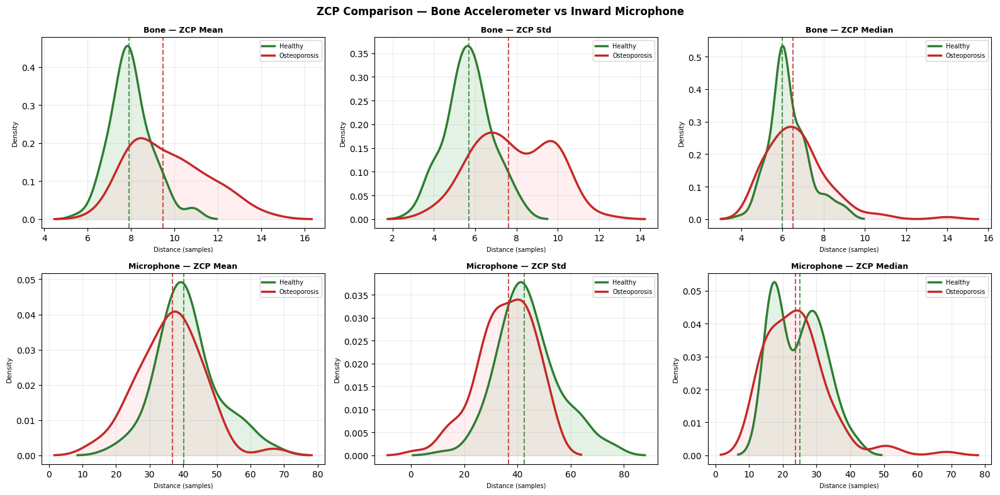

Detection count — Bone vs Microphone:
  Session      |   Bone |    Mic |   Expected
  ----------------------------------------
  P1_s1        |     13 |     13 | 13-14
  P1_s2        |     15 |     15 | 15-15
  P1_s3        |     13 |     13 | 13-13
  P1_s4        |     13 |     14 | 13-14
  P3_s1        |     12 |     12 | 12-12
  P3_s2        |     12 |     14 | 12-14
  P3_s3        |     13 |     13 | 13-13
  P3_s4        |     12 |     12 | 12-12
  P3_O_s1      |      0 |      2 | 9-9
  P3_O_s2      |     11 |     11 | 11-11
  P3_O_s3      |     11 |      9 | 11-11
  P4_O_s1      |     10 |     12 | 12-12
  P4_O_s2      |      4 |      3 | 11-11
  P4_O_s3      |      6 |      3 | 11-11
  P5_O_s1      |     16 |     16 | 16-16
  P5_O_s2      |     19 |     19 | 19-19
  P5_O_s3      |     25 |     25 | 25-25


In [13]:
# ── Side-by-side H vs O for both modalities ──────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
fig.suptitle('ZCP Comparison — Bone Accelerometer vs Inward Microphone',
             fontsize=12, fontweight='bold')
for row, (mod_name, df_mod) in enumerate([('Bone', df_bone), ('Microphone', df_mic)]):
    for col, (name, feat) in enumerate(ZCP_FEATURES.items()):
        ax = axes[row][col]
        for lv, c, cl, lbl in [
            (0, '#2E7D32', '#A5D6A7', 'Healthy'),
            (1, '#C62828', '#FFCDD2', 'Osteoporosis'),
        ]:
            vals = df_mod[df_mod['label']==lv][feat].dropna().values
            if len(vals) < 3: continue
            kde = gaussian_kde(vals, bw_method='scott')
            xs  = np.linspace(vals.min()-vals.std(), vals.max()+vals.std(), 300)
            ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
            ax.plot(xs, kde(xs), color=c, lw=2.5, label=lbl)
            ax.axvline(np.median(vals), color=c, lw=1.5, linestyle='--', alpha=0.8)
        ax.set_title(f'{mod_name} — {name}', fontsize=9, fontweight='bold')
        ax.set_xlabel('Distance (samples)', fontsize=7)
        ax.set_ylabel('Density', fontsize=8)
        ax.legend(fontsize=7); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.show()

# ── Detection count: bone vs mic ──────────────────────────────────────────────
print('Detection count — Bone vs Microphone:')
print(f'  {"Session":12s} | {"Bone":>6s} | {"Mic":>6s} | {"Expected":>10s}')
print(f'  {"-"*40}')
for s in loaded_sessions:
    exp = s['expected_clenches']
    print(f'  {s["session_id"]:12s} | {len(s["samples_bone"]):6d} | '
          f'{len(s["samples_mic"]):6d} | {exp[0]}-{exp[1]}')

## Cell 14 — All Detected Clench Frames

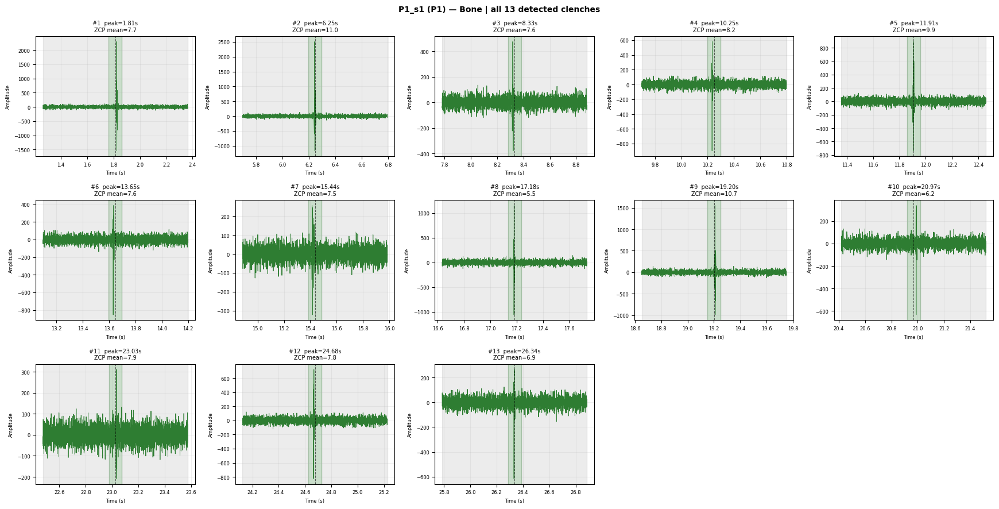

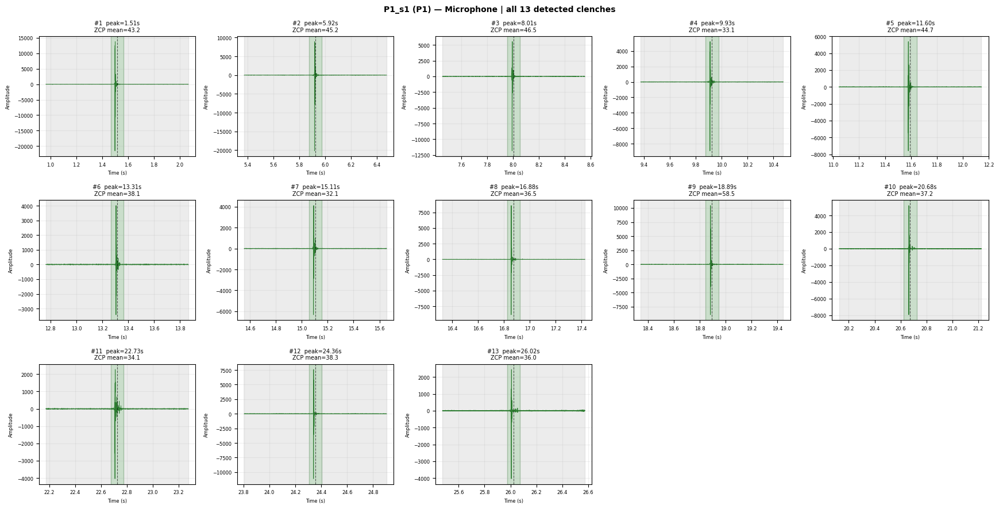

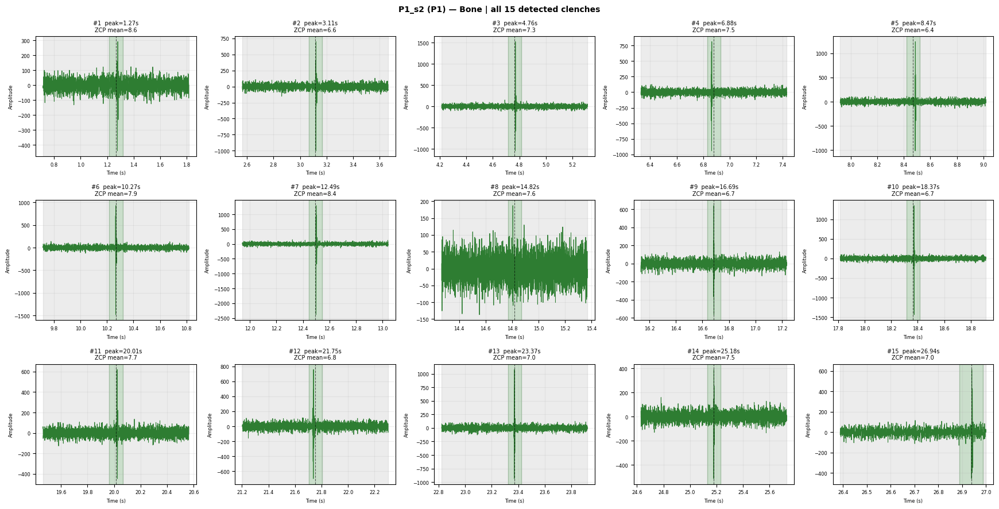

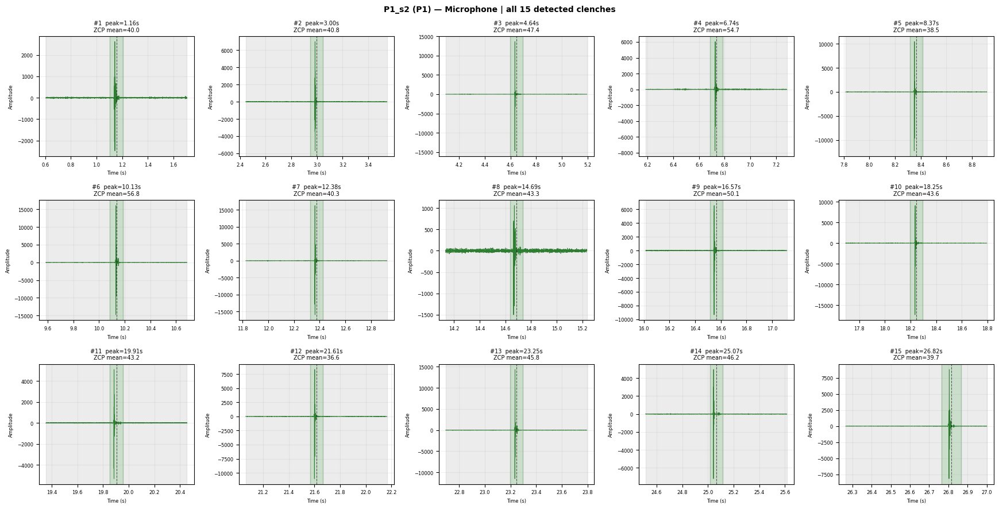

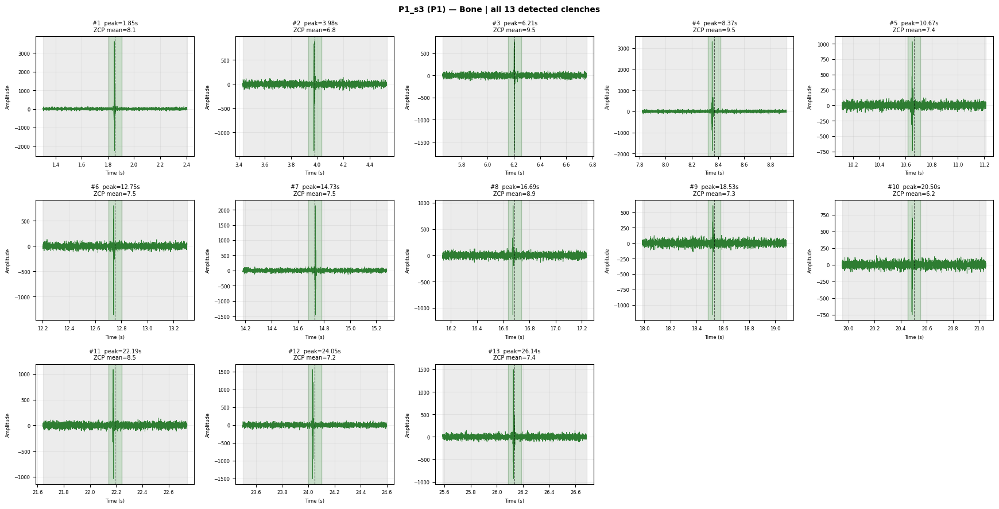

...

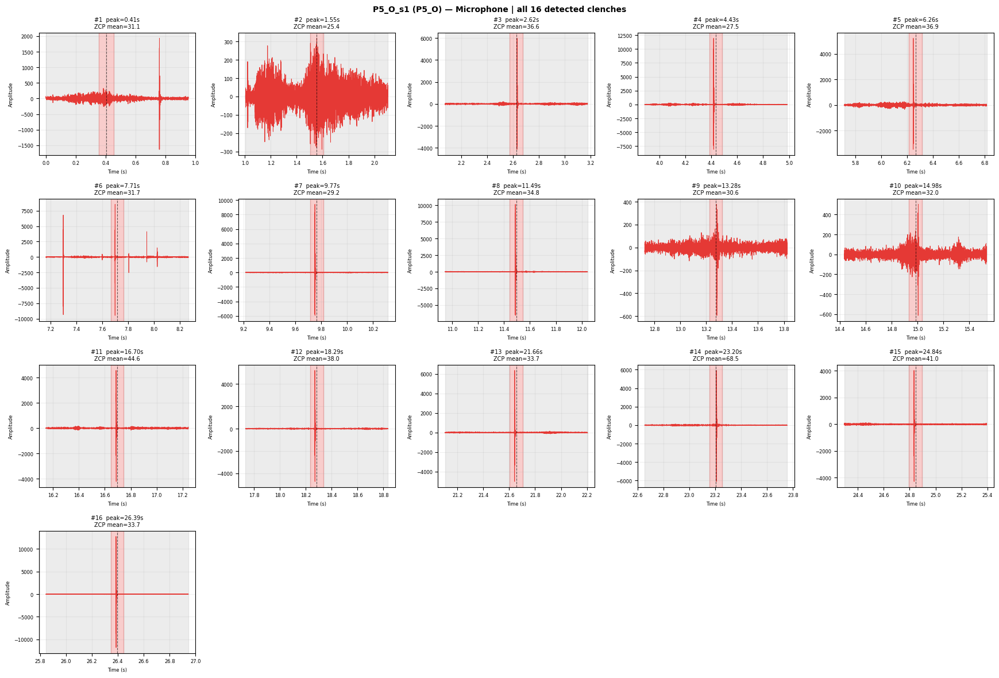

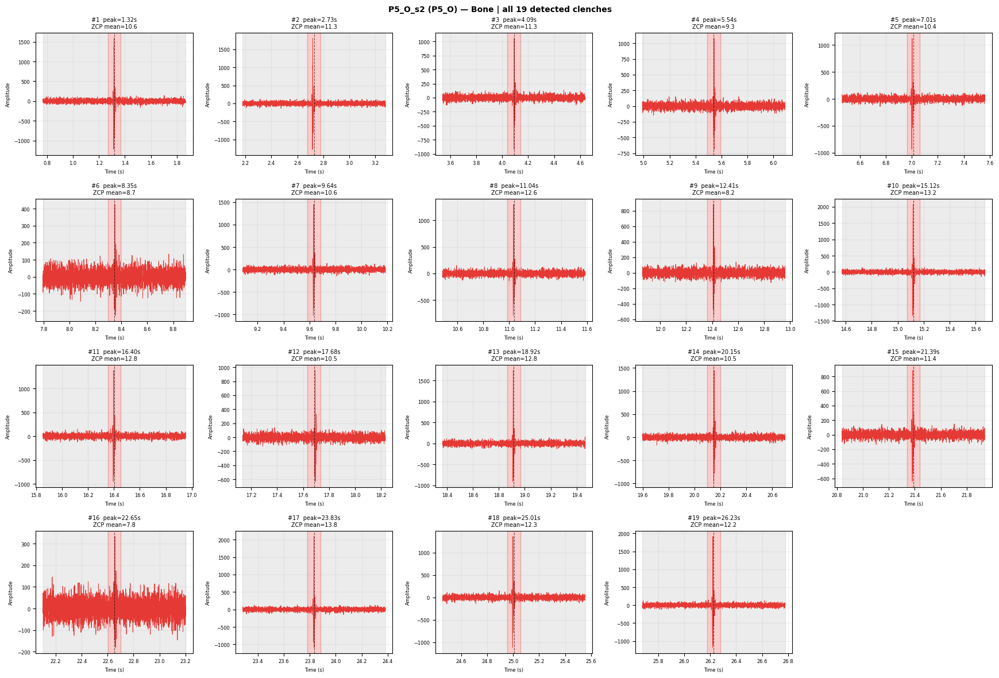

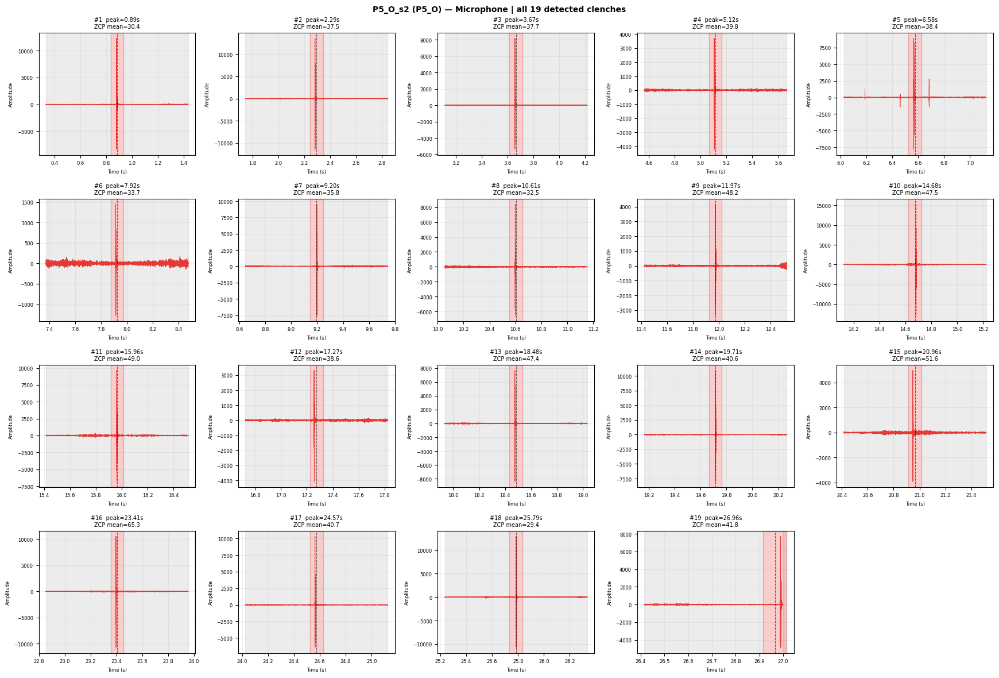

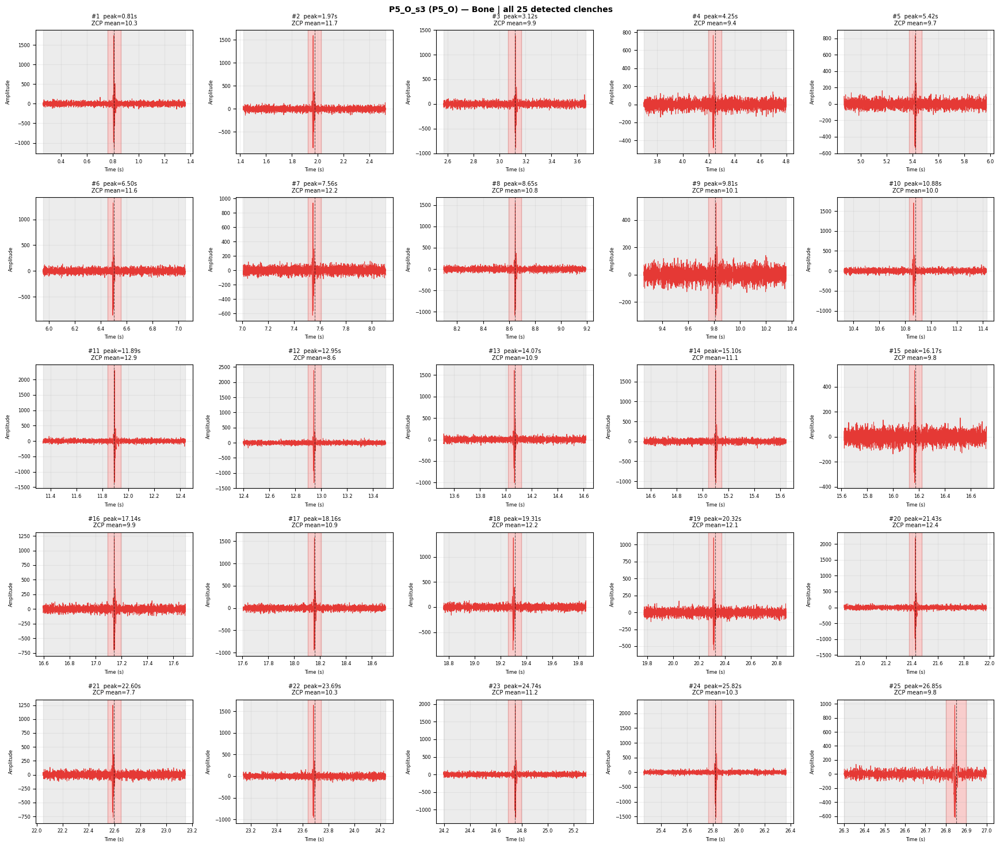

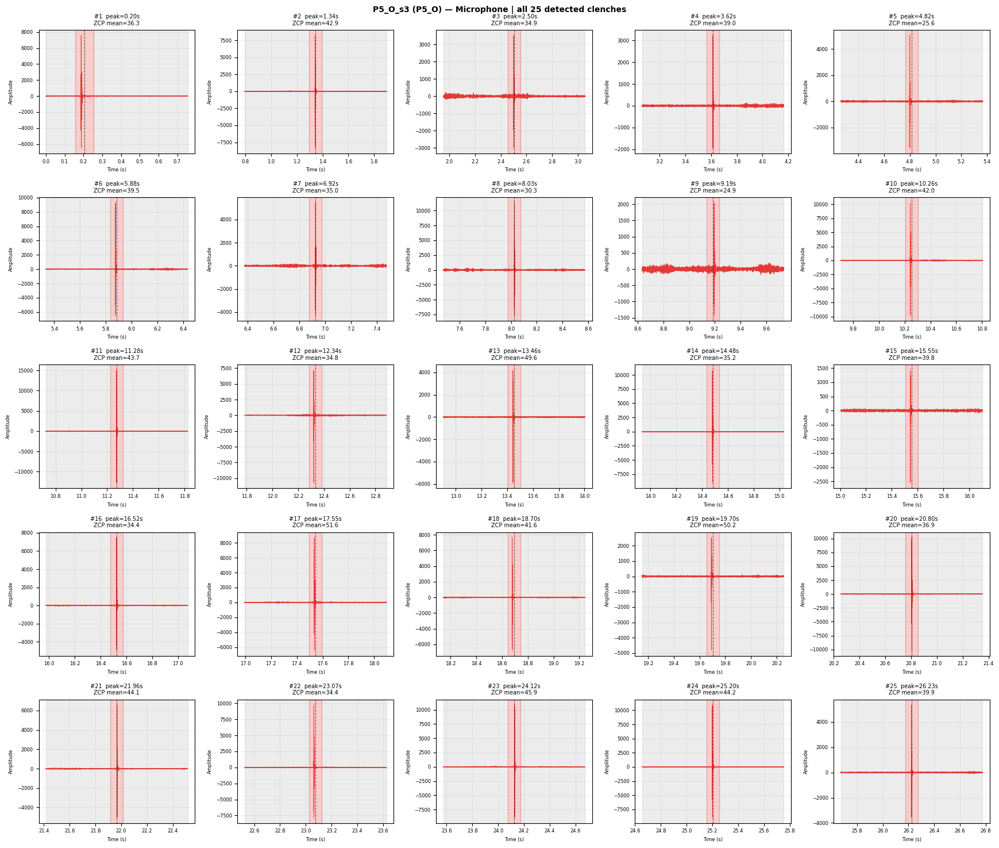

In [14]:
# ── Visualise all detected clenches with ±500 ms context window ───────────────
CONTEXT_SEC = 0.500   # context shown on each side (not part of clench)

for s in loaded_sessions:
    # Bone
    if s['samples_bone']:
        n      = len(s['samples_bone'])
        ncols  = min(5, n)
        nrows  = (n + ncols - 1) // ncols
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(ncols * 3.5, nrows * 3),
                                 squeeze=False)
        fig.suptitle(f'{s["session_id"]} ({s["participant"]}) — Bone | '
                     f'all {n} detected clenches',
                     fontsize=10, fontweight='bold')
        axes_flat = axes.flatten()

        fs        = s['fs_bone']
        bone_filt = s['bone_filt']
        bone_time = s['bone_time']
        t0        = bone_time[0]

        for j, samp in enumerate(s['samples_bone']):
            ax         = axes_flat[j]
            peak       = samp['peak_time']
            win_s      = peak - MIN_DUR_SEC - CONTEXT_SEC
            win_e      = peak + MIN_DUR_SEC + CONTEXT_SEC
            abs_ws     = t0 + max(win_s, 0)
            abs_we     = t0 + min(win_e, bone_time[-1] - t0)
            mask       = (bone_time >= abs_ws) & (bone_time <= abs_we)
            t_plot     = bone_time[mask] - t0   # relative seconds
            sig_plot   = bone_filt[mask]

            # clench boundaries in relative time
            c_s = peak - MIN_DUR_SEC
            c_e = peak + MIN_DUR_SEC

            # context regions (grey)
            ax.axvspan(t_plot[0],  c_s, alpha=0.15, color='grey')
            ax.axvspan(c_e, t_plot[-1], alpha=0.15, color='grey')

            # clench region (participant colour)
            ax.axvspan(c_s, c_e, alpha=0.25, color=s['color'])

            # signal
            ax.plot(t_plot, sig_plot, color=s['color'], lw=0.7)

            # peak marker
            ax.axvline(peak, color='black', lw=0.8, linestyle='--', alpha=0.6)

            ax.set_title(f'#{j+1}  peak={peak:.2f}s\n'
                         f'ZCP mean={samp["zcp_mean"]:.1f}',
                         fontsize=7)
            ax.set_xlabel('Time (s)', fontsize=6)
            ax.set_ylabel('Amplitude', fontsize=6)
            ax.tick_params(labelsize=6)
            ax.grid(True, alpha=0.2)

        for ax in axes_flat[n:]:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    # Microphone
    if s['samples_mic']:
        n      = len(s['samples_mic'])
        ncols  = min(5, n)
        nrows  = (n + ncols - 1) // ncols
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(ncols * 3.5, nrows * 3),
                                 squeeze=False)
        fig.suptitle(f'{s["session_id"]} ({s["participant"]}) — Microphone | '
                     f'all {n} detected clenches',
                     fontsize=10, fontweight='bold')
        axes_flat = axes.flatten()

        fs_mic       = s['fs_mic']
        inward_clean = s['inward_clean']
        t_mic        = np.arange(len(inward_clean)) / fs_mic

        for j, samp in enumerate(s['samples_mic']):
            ax     = axes_flat[j]
            peak   = samp['peak_time']
            win_s  = max(peak - MIN_DUR_SEC - CONTEXT_SEC, 0)
            win_e  = min(peak + MIN_DUR_SEC + CONTEXT_SEC, t_mic[-1])
            mask   = (t_mic >= win_s) & (t_mic <= win_e)
            t_plot = t_mic[mask]
            sig_plot = inward_clean[mask]

            c_s = peak - MIN_DUR_SEC
            c_e = peak + MIN_DUR_SEC

            # context regions (grey)
            ax.axvspan(t_plot[0],  c_s, alpha=0.15, color='grey')
            ax.axvspan(c_e, t_plot[-1], alpha=0.15, color='grey')

            # clench region (participant colour)
            ax.axvspan(c_s, c_e, alpha=0.25, color=s['color'])

            ax.plot(t_plot, sig_plot, color=s['color'], lw=0.7)
            ax.axvline(peak, color='black', lw=0.8, linestyle='--', alpha=0.6)

            ax.set_title(f'#{j+1}  peak={peak:.2f}s\n'
                         f'ZCP mean={samp["zcp_mean"]:.1f}',
                         fontsize=7)
            ax.set_xlabel('Time (s)', fontsize=6)
            ax.set_ylabel('Amplitude', fontsize=6)
            ax.tick_params(labelsize=6)
            ax.grid(True, alpha=0.2)

        for ax in axes_flat[n:]:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

## Cell 15 — Zero-Crossing Count Analysis

In [15]:
# ── Zero-crossing counts per clench (bone + mic) ────────────────────────────
# Reports min, max, and mean number of ZS distances per clench frame.

def get_zs_counts(samples, key='frame'):
    counts = []
    for samp in samples:
        frame     = samp[key]
        crossings = np.where(np.diff(np.sign(frame)) != 0)[0]
        zs        = np.diff(crossings)
        counts.append(len(zs))
    return counts

print('BONE — Zero-crossing counts per session:')
print(f'  {"Session":12s} | {"Label":10s} | {"n_clenches":>10s} | {"Min ZC":>7s} | {"Max ZC":>7s} | {"Mean ZC":>8s}')
print(f'  {"-"*70}')

all_bone = []
for s in loaded_sessions:
    counts = get_zs_counts(s['samples_bone'])
    if not counts: continue
    all_bone.extend(counts)
    print(f'  {s["session_id"]:12s} | {s["label_str"]:10s} | {len(counts):10d} | '
          f'{min(counts):7d} | {max(counts):7d} | {np.mean(counts):8.1f}')

print(f'\n  Overall — Min: {min(all_bone)}  Max: {max(all_bone)}  Mean: {np.mean(all_bone):.1f}')

print()
print('MIC — Zero-crossing counts per session:')
print(f'  {"Session":12s} | {"Label":10s} | {"n_clenches":>10s} | {"Min ZC":>7s} | {"Max ZC":>7s} | {"Mean ZC":>8s}')
print(f'  {"-"*70}')

all_mic = []
for s in loaded_sessions:
    counts = get_zs_counts(s['samples_mic'])
    if not counts: continue
    all_mic.extend(counts)
    print(f'  {s["session_id"]:12s} | {s["label_str"]:10s} | {len(counts):10d} | '
          f'{min(counts):7d} | {max(counts):7d} | {np.mean(counts):8.1f}')

print(f'\n  Overall — Min: {min(all_mic)}  Max: {max(all_mic)}  Mean: {np.mean(all_mic):.1f}')

BONE — Zero-crossing counts per session:
  Session      | Label      | n_clenches |  Min ZC |  Max ZC |  Mean ZC
  ----------------------------------------------------------------------
  P1_s1        | healthy    |         13 |      28 |      57 |     40.1
  P1_s2        | healthy    |         15 |      37 |      48 |     43.1
  P1_s3        | healthy    |         13 |      32 |      50 |     40.5
  P1_s4        | healthy    |         13 |      33 |      46 |     39.6
  P3_s1        | healthy    |         12 |      36 |      47 |     40.8
  P3_s2        | healthy    |         12 |      29 |      42 |     36.6
  P3_s3        | healthy    |         13 |      32 |      47 |     37.8
  P3_s4        | healthy    |         12 |      32 |      42 |     37.2
  P3_O_s2      | osteoporosis |         11 |      31 |      43 |     36.7
  P3_O_s3      | osteoporosis |         11 |      32 |      40 |     36.3
  P4_O_s1      | osteoporosis |         10 |      32 |      41 |     37.7
  P4_O_s2      |

## Cell 16 — ZS Dispersion Feature Extraction
`ZS split into early / mid / late thirds → mean, std, slope per segment + overall slope`

In [16]:
# ── ZS Dispersion Features (early / mid / late + overall slope) ───────────────
#
# Each ZS sequence is split into three equal proportional segments:
#   early = first  33%  of ZS distances
#   mid   = middle 33%
#   late  = last   33%
#
# From each segment: mean, std, and linear slope (fit on segment points)
# overall_slope = linear fit slope across the full ZS sequence

def zs_segment_features(zs):
    n = len(zs)
    if n < 6:
        return {k: np.nan for k in [
            'early_mean','early_std','early_slope',
            'mid_mean',  'mid_std',  'mid_slope',
            'late_mean', 'late_std', 'late_slope',
            'overall_slope']}

    def seg_features(seg, name):
        seg = np.array(seg, dtype=float)
        x   = np.arange(len(seg), dtype=float)
        sl  = float(np.polyfit(x, seg, 1)[0]) if len(seg) > 1 else 0.0
        return {f'{name}_mean': float(np.mean(seg)),
                f'{name}_std':  float(np.std(seg)),
                f'{name}_slope': sl}

    i1 = n // 3
    i2 = 2 * n // 3

    zs_arr = np.array(zs, dtype=float)
    feats  = {}
    feats.update(seg_features(zs_arr[:i1],  'early'))
    feats.update(seg_features(zs_arr[i1:i2],'mid'))
    feats.update(seg_features(zs_arr[i2:],  'late'))

    # overall slope: linear fit across all ZS points
    x_all = np.arange(n, dtype=float)
    feats['overall_slope'] = float(np.polyfit(x_all, zs_arr, 1)[0])

    return feats

DISP_KEYS     = ['early_mean','early_std','early_slope',
                 'mid_mean',  'mid_std',  'mid_slope',
                 'late_mean', 'late_std', 'late_slope',
                 'overall_slope']
bone_disp_keys = [f'bone_{k}' for k in DISP_KEYS]
mic_disp_keys  = [f'mic_{k}'  for k in DISP_KEYS]

# ── Apply to bone ─────────────────────────────────────────────────────────────
for s in loaded_sessions:
    for samp in s['samples_bone']:
        crossings = np.where(np.diff(np.sign(samp['frame'])) != 0)[0]
        zs        = list(np.diff(crossings).astype(float))
        feats     = zs_segment_features(zs)
        samp.update({f'bone_{k}': v for k, v in feats.items()})

for k in bone_disp_keys:
    df_bone[k] = [samp.get(k, np.nan)
                  for s in loaded_sessions for samp in s['samples_bone']]

# ── Apply to mic ──────────────────────────────────────────────────────────────
for s in loaded_sessions:
    for samp in s['samples_mic']:
        crossings = np.where(np.diff(np.sign(samp['frame'])) != 0)[0]
        zs        = list(np.diff(crossings).astype(float))
        feats     = zs_segment_features(zs)
        samp.update({f'mic_{k}': v for k, v in feats.items()})

for k in mic_disp_keys:
    df_mic[k] = [samp.get(k, np.nan)
                 for s in loaded_sessions for samp in s['samples_mic']]

print('ZS Dispersion features computed.')
print()
print('Bone — H vs O (median):')
print(f'  {"Feature":22s} | {"H":>8s} | {"O":>8s} | {"Delta%":>8s}')
print(f'  {"-"*52}')
for k in bone_disp_keys:
    h = df_bone[df_bone['label']==0][k].median()
    o = df_bone[df_bone['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:22s} | {h:8.3f} | {o:8.3f} | {d:+8.1f}%')

print()
print('Mic — H vs O (median):')
print(f'  {"Feature":22s} | {"H":>8s} | {"O":>8s} | {"Delta%":>8s}')
print(f'  {"-"*52}')
for k in mic_disp_keys:
    h = df_mic[df_mic['label']==0][k].median()
    o = df_mic[df_mic['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:22s} | {h:8.3f} | {o:8.3f} | {d:+8.1f}%')

ZS Dispersion features computed.

Bone — H vs O (median):
  Feature                |        H |        O |   Delta%
  ----------------------------------------------------
  bone_early_mean        |    7.667 |    7.693 |     -0.3%
  bone_early_std         |    4.410 |    4.756 |     -7.3%
  bone_early_slope       |    0.150 |    0.029 |   +414.2%
  bone_mid_mean          |    7.909 |    8.411 |     -6.0%
  bone_mid_std           |    5.108 |    6.378 |    -19.9%
  bone_mid_slope         |    0.099 |    0.111 |    -10.8%
  bone_late_mean         |    6.615 |    7.769 |    -14.9%
  bone_late_std          |    3.861 |    4.825 |    -20.0%
  bone_late_slope        |   -0.099 |   -0.101 |     +2.3%
  bone_overall_slope     |   -0.028 |   -0.001 |  -2577.8%

Mic — H vs O (median):
  Feature                |        H |        O |   Delta%
  ----------------------------------------------------
  mic_early_mean         |   46.256 |   33.810 |    +36.8%
  mic_early_std          |   52.347 |   30.

## Cell 17 — ZS Dispersion Feature Visualisation

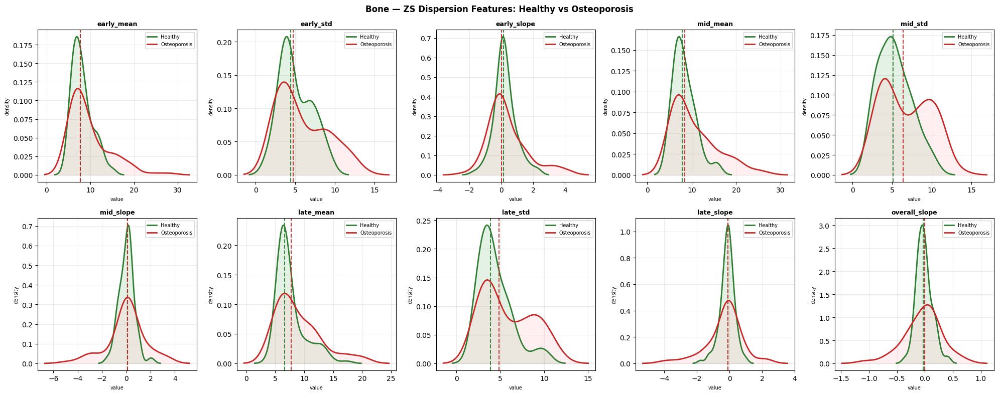

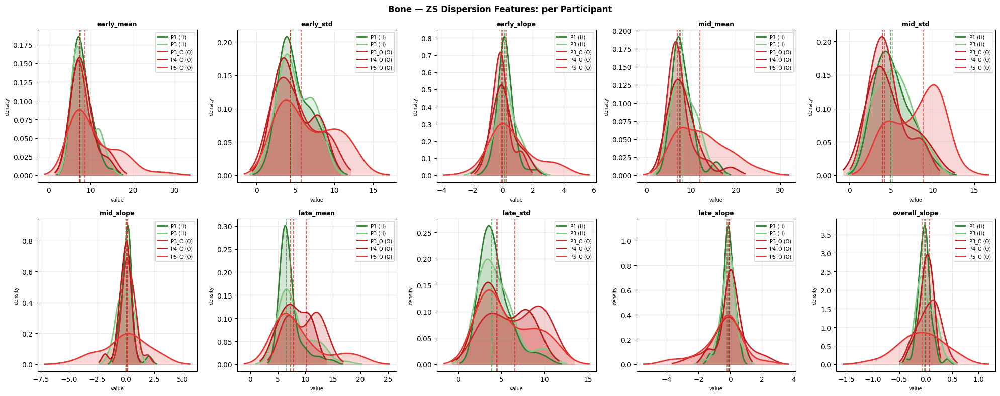

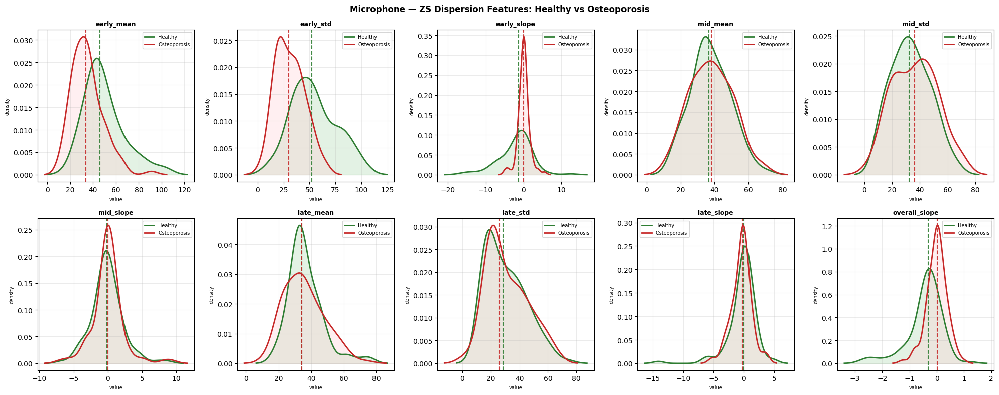

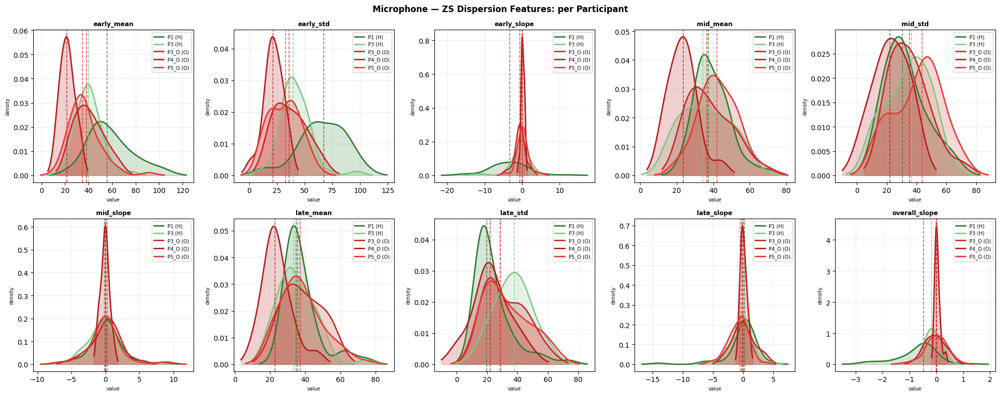

ZS dispersion visualisation complete.


In [17]:
# ── Visualise ZS Dispersion Features ─────────────────────────────────────────
from scipy.stats import gaussian_kde

for mod_name, df_mod, keys in [
    ('Bone',       df_bone, bone_disp_keys),
    ('Microphone', df_mic,  mic_disp_keys),
]:
    # ── H vs O ───────────────────────────────────────────────────────────────
    ncols = 5
    nrows = 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 8))
    fig.suptitle(f'{mod_name} — ZS Dispersion Features: Healthy vs Osteoporosis',
                 fontsize=12, fontweight='bold')
    axes = axes.flatten()

    for idx, k in enumerate(keys):
        ax = axes[idx]
        for lv, c, cl, lbl in [
            (0, '#2E7D32', '#A5D6A7', 'Healthy'),
            (1, '#C62828', '#FFCDD2', 'Osteoporosis'),
        ]:
            vals = df_mod[df_mod['label']==lv][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.5,
                           linestyle='--', alpha=0.9)
            except:
                ax.hist(vals, bins=8, color=cl, alpha=0.5, label=lbl)
        ax.set_title(k.replace('bone_','').replace('mic_',''),
                     fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)

    for ax in axes[len(keys):]: ax.axis('off')
    plt.tight_layout()
    plt.show()

    # ── Per participant ───────────────────────────────────────────────────────
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 8))
    fig.suptitle(f'{mod_name} — ZS Dispersion Features: per Participant',
                 fontsize=12, fontweight='bold')
    axes = axes.flatten()

    for idx, k in enumerate(keys):
        ax = axes[idx]
        for pid in sorted(df_mod['participant'].unique()):
            c    = PARTICIPANT_COLORS[pid]
            lv   = df_mod[df_mod['participant']==pid]['label'].iloc[0]
            lbl  = f'{pid} ({"H" if lv==0 else "O"})'
            vals = df_mod[df_mod['participant']==pid][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.2, color=c)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.2,
                           linestyle='--', alpha=0.8)
            except:
                ax.hist(vals, bins=8, color=c, alpha=0.4, label=lbl)
        ax.set_title(k.replace('bone_','').replace('mic_',''),
                     fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)

    for ax in axes[len(keys):]: ax.axis('off')
    plt.tight_layout()
    plt.show()

print('ZS dispersion visualisation complete.')

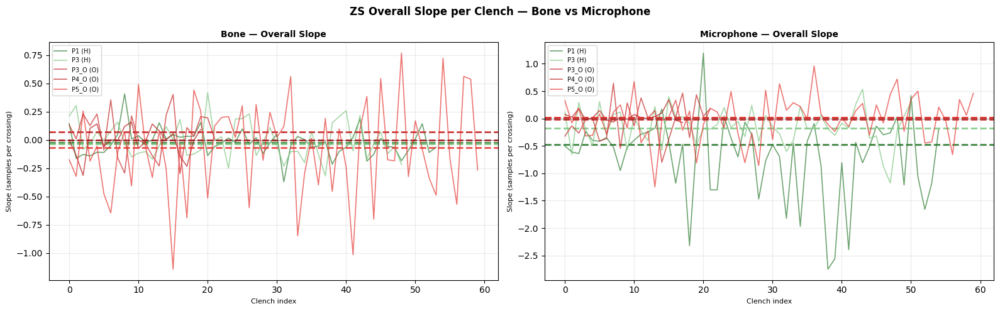

In [18]:
# ── Overall Slope: line plots per participant ─────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('ZS Overall Slope per Clench — Bone vs Microphone',
             fontsize=12, fontweight='bold')

for ax, (mod_name, df_mod) in zip(axes, [
    ('Bone',       df_bone),
    ('Microphone', df_mic),
]):
    feat = 'bone_overall_slope' if mod_name == 'Bone' else 'mic_overall_slope'

    for pid in sorted(df_mod['participant'].unique()):
        c    = PARTICIPANT_COLORS[pid]
        lv   = df_mod[df_mod['participant']==pid]['label'].iloc[0]
        lbl  = f'{pid} ({"H" if lv==0 else "O"})'
        vals = df_mod[df_mod['participant']==pid][feat].dropna().values
        x    = np.arange(len(vals))
        ax.plot(x, vals, color=c, lw=1.2, alpha=0.7, label=lbl)
        ax.axhline(np.median(vals), color=c, lw=2,
                   linestyle='--', alpha=0.9)

    ax.axhline(0, color='black', lw=0.8, linestyle='-', alpha=0.3)
    ax.set_title(f'{mod_name} — Overall Slope', fontsize=10, fontweight='bold')
    ax.set_xlabel('Clench index', fontsize=8)
    ax.set_ylabel('Slope (samples per crossing)', fontsize=8)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.25)

plt.tight_layout()
plt.show()

## Cell 18 — Spectral Feature Extraction
`Spectral Centroid | Spectral Rolloff | Spectral Entropy | Dominant Frequency`

In [19]:
# ── Spectral Features: Spectral Centroid, Rolloff, Entropy, Dominant Frequency ─
#
# Applied to both bone and mic clench frames independently.
# Features per frame:
#   spectral_centroid  — frequency-weighted mean of the spectrum
#   spectral_rolloff   — frequency below which 85% of energy falls
#   spectral_entropy   — uniformity of energy distribution across frequency bins
#   dominant_freq      — frequency bin with highest energy

def compute_spectral_features(frame, fs):
    n     = len(frame)
    fft   = np.abs(np.fft.rfft(frame))
    freqs = np.fft.rfftfreq(n, d=1.0/fs)
    psd   = fft ** 2
    total = psd.sum() + 1e-10

    # Spectral Centroid
    centroid = float(np.sum(freqs * psd) / total)

    # Spectral Rolloff (85%)
    cumsum      = np.cumsum(psd)
    rolloff_idx = np.searchsorted(cumsum, 0.85 * cumsum[-1])
    rolloff     = float(freqs[min(rolloff_idx, len(freqs)-1)])

    # Spectral Entropy
    psd_norm = psd / total
    psd_norm = np.clip(psd_norm, 1e-12, None)
    entropy  = float(-np.sum(psd_norm * np.log2(psd_norm)))

    # Dominant Frequency
    dominant = float(freqs[np.argmax(psd)])

    return {
        'spectral_centroid': centroid,
        'spectral_rolloff':  rolloff,
        'spectral_entropy':  entropy,
        'dominant_freq':     dominant,
    }

SPECTRAL_KEYS      = ['spectral_centroid','spectral_rolloff','spectral_entropy','dominant_freq']
bone_spectral_keys = [f'bone_{k}' for k in SPECTRAL_KEYS]
mic_spectral_keys  = [f'mic_{k}'  for k in SPECTRAL_KEYS]

# Bone
for s in loaded_sessions:
    fs = s['fs_bone']
    for samp in s['samples_bone']:
        feats = compute_spectral_features(samp['frame'], fs)
        samp.update({f'bone_{k}': v for k, v in feats.items()})

for k in bone_spectral_keys:
    df_bone[k] = [samp.get(k, np.nan)
                  for s in loaded_sessions for samp in s['samples_bone']]

# Mic
for s in loaded_sessions:
    fs = s['fs_mic']
    for samp in s['samples_mic']:
        feats = compute_spectral_features(samp['frame'], fs)
        samp.update({f'mic_{k}': v for k, v in feats.items()})

for k in mic_spectral_keys:
    df_mic[k] = [samp.get(k, np.nan)
                 for s in loaded_sessions for samp in s['samples_mic']]

print('Spectral features computed.')
print()
print('Bone — H vs O (median):')
print(f'  {"Feature":25s} | {"H":>10s} | {"O":>10s} | {"Delta%":>8s}')
print(f'  {"-"*58}')
for k in bone_spectral_keys:
    h = df_bone[df_bone['label']==0][k].median()
    o = df_bone[df_bone['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:25s} | {h:10.3f} | {o:10.3f} | {d:+8.1f}%')

print()
print('Mic — H vs O (median):')
print(f'  {"Feature":25s} | {"H":>10s} | {"O":>10s} | {"Delta%":>8s}')
print(f'  {"-"*58}')
for k in mic_spectral_keys:
    h = df_mic[df_mic['label']==0][k].median()
    o = df_mic[df_mic['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:25s} | {h:10.3f} | {o:10.3f} | {d:+8.1f}%')

Spectral features computed.

Bone — H vs O (median):
  Feature                   |          H |          O |   Delta%
  ----------------------------------------------------------
  bone_spectral_centroid    |    233.257 |    198.278 |    +17.6%
  bone_spectral_rolloff     |    379.604 |    260.949 |    +45.5%
  bone_spectral_entropy     |      3.866 |      3.659 |     +5.7%
  bone_dominant_freq        |    219.771 |    119.875 |    +83.3%

Mic — H vs O (median):
  Feature                   |          H |          O |   Delta%
  ----------------------------------------------------------
  mic_spectral_centroid     |    665.748 |    781.197 |    -14.8%
  mic_spectral_rolloff      |   1220.000 |   1030.000 |    +18.4%
  mic_spectral_entropy      |      5.678 |      5.517 |     +2.9%
  mic_dominant_freq         |    310.000 |    680.000 |    -54.4%


## Cell 19 — Spectral Feature Visualisation

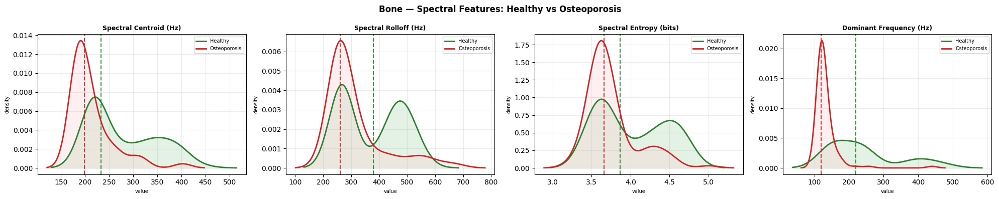

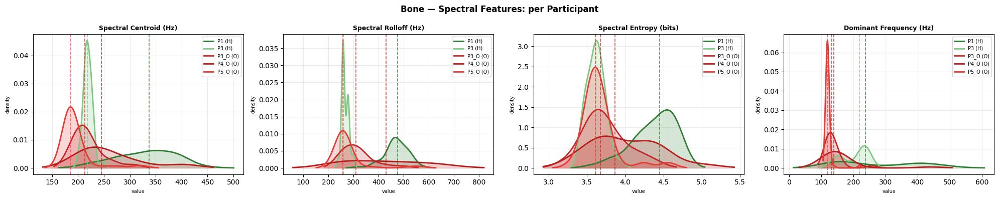

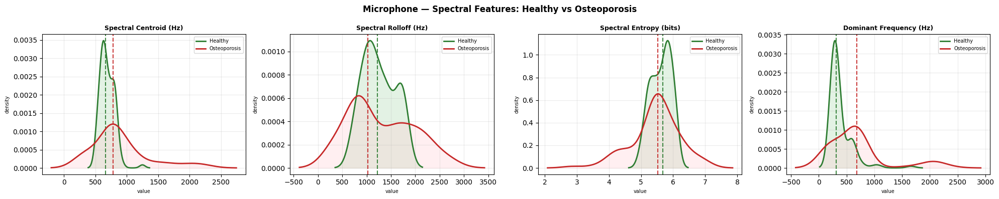

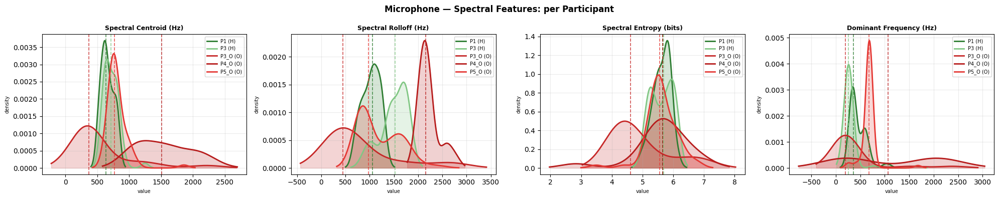

Spectral features visualisation complete.


In [20]:
# ── Spectral Features Visualisation ──────────────────────────────────────────
from scipy.stats import gaussian_kde

SPECTRAL_LABELS = {
    'spectral_centroid': 'Spectral Centroid (Hz)',
    'spectral_rolloff':  'Spectral Rolloff (Hz)',
    'spectral_entropy':  'Spectral Entropy (bits)',
    'dominant_freq':     'Dominant Frequency (Hz)',
}

for mod_name, df_mod, keys in [
    ('Bone',       df_bone, bone_spectral_keys),
    ('Microphone', df_mic,  mic_spectral_keys),
]:
    # H vs O
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.suptitle(f'{mod_name} — Spectral Features: Healthy vs Osteoporosis',
                 fontsize=12, fontweight='bold')
    for idx, k in enumerate(keys):
        ax   = axes[idx]
        base = k.replace('bone_','').replace('mic_','')
        for lv, c, cl, lbl in [
            (0, '#2E7D32', '#A5D6A7', 'Healthy'),
            (1, '#C62828', '#FFCDD2', 'Osteoporosis'),
        ]:
            vals = df_mod[df_mod['label']==lv][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.5,
                           linestyle='--', alpha=0.9)
            except:
                ax.hist(vals, bins=8, color=cl, alpha=0.5, label=lbl)
        ax.set_title(SPECTRAL_LABELS.get(base, base), fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)
    plt.tight_layout(); plt.show()

    # Per participant
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.suptitle(f'{mod_name} — Spectral Features: per Participant',
                 fontsize=12, fontweight='bold')
    for idx, k in enumerate(keys):
        ax   = axes[idx]
        base = k.replace('bone_','').replace('mic_','')
        for pid in sorted(df_mod['participant'].unique()):
            c    = PARTICIPANT_COLORS[pid]
            lv   = df_mod[df_mod['participant']==pid]['label'].iloc[0]
            lbl  = f'{pid} ({"H" if lv==0 else "O"})'
            vals = df_mod[df_mod['participant']==pid][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.2, color=c)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.2,
                           linestyle='--', alpha=0.8)
            except:
                ax.hist(vals, bins=8, color=c, alpha=0.4, label=lbl)
        ax.set_title(SPECTRAL_LABELS.get(base, base), fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)
    plt.tight_layout(); plt.show()

print('Spectral features visualisation complete.')

## Cell 20 — Time Domain Feature Extraction
`RMS Energy | Std | Peak Amplitude | Skewness | Kurtosis`

In [21]:
# ── Time Domain Features: RMS, Std, Peak, Skewness, Kurtosis ────────────────
#
# Applied to both bone and mic clench frames independently.
# Features per frame:
#   rms_energy   — root mean square amplitude
#   std_amp      — standard deviation of amplitude
#   peak_amp     — maximum absolute amplitude
#   skewness     — asymmetry of amplitude distribution
#   kurtosis     — peakedness / tail weight of amplitude distribution

def compute_time_features(frame):
    frame = np.array(frame, dtype=float)
    n     = len(frame)
    mu    = frame.mean()
    sd    = frame.std() + 1e-10

    rms      = float(np.sqrt(np.mean(frame**2)))
    std_amp  = float(frame.std())
    peak_amp = float(np.max(np.abs(frame)))
    skew     = float(np.mean(((frame - mu)/sd)**3))
    kurt     = float(np.mean(((frame - mu)/sd)**4) - 3)

    return {
        'rms_energy': rms,
        'std_amp':    std_amp,
        'peak_amp':   peak_amp,
        'skewness':   skew,
        'kurtosis':   kurt,
    }

TIME_KEYS      = ['rms_energy','std_amp','peak_amp','skewness','kurtosis']
bone_time_keys = [f'bone_{k}' for k in TIME_KEYS]
mic_time_keys  = [f'mic_{k}'  for k in TIME_KEYS]

# Bone
for s in loaded_sessions:
    for samp in s['samples_bone']:
        feats = compute_time_features(samp['frame'])
        samp.update({f'bone_{k}': v for k, v in feats.items()})

for k in bone_time_keys:
    df_bone[k] = [samp.get(k, np.nan)
                  for s in loaded_sessions for samp in s['samples_bone']]

# Mic
for s in loaded_sessions:
    for samp in s['samples_mic']:
        feats = compute_time_features(samp['frame'])
        samp.update({f'mic_{k}': v for k, v in feats.items()})

for k in mic_time_keys:
    df_mic[k] = [samp.get(k, np.nan)
                 for s in loaded_sessions for samp in s['samples_mic']]

print('Time domain features computed.')
print()
print('Bone — H vs O (median):')
print(f'  {"Feature":20s} | {"H":>10s} | {"O":>10s} | {"Delta%":>8s}')
print(f'  {"-"*53}')
for k in bone_time_keys:
    h = df_bone[df_bone['label']==0][k].median()
    o = df_bone[df_bone['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:20s} | {h:10.4f} | {o:10.4f} | {d:+8.1f}%')

print()
print('Mic — H vs O (median):')
print(f'  {"Feature":20s} | {"H":>10s} | {"O":>10s} | {"Delta%":>8s}')
print(f'  {"-"*53}')
for k in mic_time_keys:
    h = df_mic[df_mic['label']==0][k].median()
    o = df_mic[df_mic['label']==1][k].median()
    d = (h-o)/(abs(o)+1e-10)*100
    print(f'  {k:20s} | {h:10.4f} | {o:10.4f} | {d:+8.1f}%')

Time domain features computed.

Bone — H vs O (median):
  Feature              |          H |          O |   Delta%
  -----------------------------------------------------
  bone_rms_energy      |     0.0631 |     0.0631 |     +0.0%
  bone_std_amp         |     0.0631 |     0.0631 |     +0.0%
  bone_peak_amp        |     0.2989 |     0.2650 |    +12.8%
  bone_skewness        |    -0.2626 |     1.0513 |   -125.0%
  bone_kurtosis        |     9.1037 |     5.1863 |    +75.5%

Mic — H vs O (median):
  Feature              |          H |          O |   Delta%
  -----------------------------------------------------
  mic_rms_energy       |     0.0631 |     0.0631 |     +0.0%
  mic_std_amp          |     0.0631 |     0.0631 |     +0.0%
  mic_peak_amp         |     0.5634 |     0.5159 |     +9.2%
  mic_skewness         |    -2.0566 |     0.2457 |   -937.0%
  mic_kurtosis         |    28.0764 |    27.0713 |     +3.7%


## Cell 21 — Time Domain Feature Visualisation

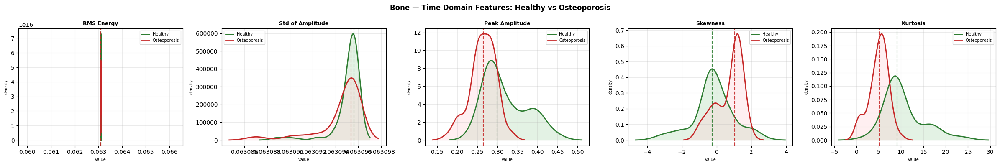

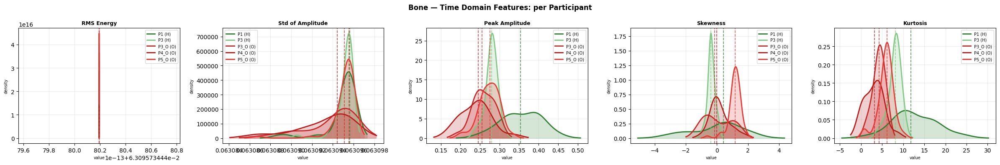

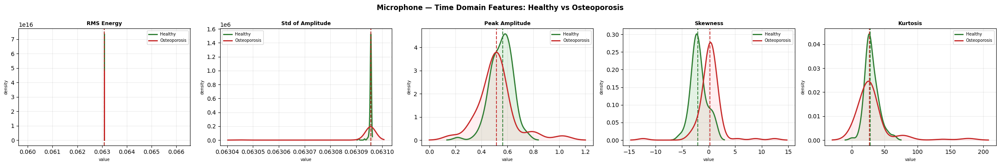

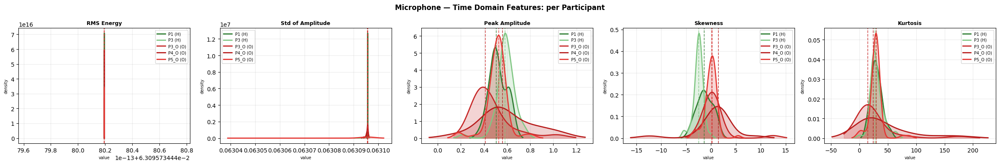

Time domain features visualisation complete.


In [22]:
# ── Time Domain Features Visualisation ───────────────────────────────────────
from scipy.stats import gaussian_kde

TIME_LABELS = {
    'rms_energy': 'RMS Energy',
    'std_amp':    'Std of Amplitude',
    'peak_amp':   'Peak Amplitude',
    'skewness':   'Skewness',
    'kurtosis':   'Kurtosis',
}

for mod_name, df_mod, keys in [
    ('Bone',       df_bone, bone_time_keys),
    ('Microphone', df_mic,  mic_time_keys),
]:
    # H vs O
    fig, axes = plt.subplots(1, 5, figsize=(24, 4))
    fig.suptitle(f'{mod_name} — Time Domain Features: Healthy vs Osteoporosis',
                 fontsize=12, fontweight='bold')
    for idx, k in enumerate(keys):
        ax   = axes[idx]
        base = k.replace('bone_','').replace('mic_','')
        for lv, c, cl, lbl in [
            (0, '#2E7D32', '#A5D6A7', 'Healthy'),
            (1, '#C62828', '#FFCDD2', 'Osteoporosis'),
        ]:
            vals = df_mod[df_mod['label']==lv][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.3, color=cl)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.5,
                           linestyle='--', alpha=0.9)
            except:
                ax.hist(vals, bins=8, color=cl, alpha=0.5, label=lbl)
        ax.set_title(TIME_LABELS.get(base, base), fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)
    plt.tight_layout(); plt.show()

    # Per participant
    fig, axes = plt.subplots(1, 5, figsize=(24, 4))
    fig.suptitle(f'{mod_name} — Time Domain Features: per Participant',
                 fontsize=12, fontweight='bold')
    for idx, k in enumerate(keys):
        ax   = axes[idx]
        base = k.replace('bone_','').replace('mic_','')
        for pid in sorted(df_mod['participant'].unique()):
            c    = PARTICIPANT_COLORS[pid]
            lv   = df_mod[df_mod['participant']==pid]['label'].iloc[0]
            lbl  = f'{pid} ({"H" if lv==0 else "O"})'
            vals = df_mod[df_mod['participant']==pid][k].dropna().values
            if len(vals) < 3: continue
            try:
                kde = gaussian_kde(vals, bw_method='scott')
                xs  = np.linspace(vals.min()-abs(vals.std()),
                                  vals.max()+abs(vals.std()), 300)
                ax.fill_between(xs, kde(xs), alpha=0.2, color=c)
                ax.plot(xs, kde(xs), color=c, lw=2, label=lbl)
                ax.axvline(np.median(vals), color=c, lw=1.2,
                           linestyle='--', alpha=0.8)
            except:
                ax.hist(vals, bins=8, color=c, alpha=0.4, label=lbl)
        ax.set_title(TIME_LABELS.get(base, base), fontsize=9, fontweight='bold')
        ax.set_xlabel('value', fontsize=7)
        ax.set_ylabel('density', fontsize=7)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.25)
    plt.tight_layout(); plt.show()

print('Time domain features visualisation complete.')